## Intro

The main target of this project is to create an infrastructrure for the development of an automated system for reality-representation proposition highlighting (we´ll call it REPHI for short). 
This comprises the first of these 8 steps we need to take to achive our REPHI system:

INFORMATION STRUCTURING: 
- Extract sentences from structured text 
- Extract sentences from unstructured text
- Extract propositions  

TEXT CLASSIFICATION:
- Classifying text that talks about reality vs fictional text. The last includes text with sentences in it that talk *about* reality but from a fictional context. 
- Separating text that talks about reality and its mechanism from text talking about transitorial events (news or casuistic). 
- Separating dialogs from narratives.
- Separating text that purely describes reality from those that prescribe reality (research and reflections vs manuals).  

DEVELOP GUIDED HIGHLIGHTER:
- Add-in for FF and/or Chrome using previous outcomes for structuring the selection. 
- Incorporating the good-quality info scoring system.

The target now is **extracting sentences from text** first from already structured text (text which has already been tagged and or separated into sentences), i.e. one of the tagged NLTK corpora. We will aply a simple classification algorythm to it and see how well it fares. Then we will try to aplly it to unstructured text from the web. 

The second and third step of the broader project are the first steps of each part, i.e,  classifying text as fictional or reality (first from text classification), and developing an add-in for FF using the previous outcomes (first of Highlighter development). Although they are initially out of the scope of this project we need to be mindful of the overall target on each step we are executing, to frame it and to be focused on the practical side of it. 


## Importing packages

In [43]:
from IPython.display import display # permite mostrar todas las columnas en jupyter
import nltk
from nltk.book import * 
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.draw import dispersion_plot
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import numpy as np

from sklearn import model_selection

In [2]:
from nltk.corpus import brown  #or this might just point to brown directly, without need of nltk.corpus.brown
#see help(brown), brown? or brown?? for info
from nltk.corpus import treebank

# Corpora exploration


Structuring information at the sentence level is something that can be done in most of the corpora, so we choose to start with the Brown package and the Penn Treebank because they contain tagged text on "real" (non-fictional) topics and the latter also classifies the text in 15 genres including "learned". 

The NLTK corpus collection includes a sample of **Penn Treebank** data, including the raw Wall Street Journal text:  
`nltk.corpus.treebank_raw.raw()`  
(for it's tokenized version: `nltk.corpus.treebank.words()`)
We will try in two different corpus but both including factual texts. 

#### Corpora and code

<div style='color:#707070'>brown allows performing basic instructions, pero para más operaciones hay que importar el <b>reader</b> de cada corpus. Los readers tienen una serie de operaciones comunes para todos los corpus como mostrar categorías o mostrar las sentencias: </div>

You could find elsewhere some nltk lines code using Text(), as in: 
`learnFiles = Text(brown.fileids(categories='learned'))`  . **Text()** is wrapper around a sequence of simple (string) tokens, which is intended to support initial exploration of texts (via the interactive console). Its methods perform a variety of analyses on the text’s contexts (e.g., counting, concordancing, collocation discovery).  

But we don't need to use it for the basic reader methods. 

# Corpora analytics

### brown and treebank compared

In [6]:
# Pop-up basic info - use it for help
# brown?;

In [7]:
# treebank?

In [ ]:
# brown??

Some corpora like these two include a way of selecting sentences. They have been manuallly selected. The instruction `.sents` gives us those sentences.

#### Files

The **format** of a **raw** text is a string with tagged POS:

In [23]:
treebank.raw('wsj_0001.mrg')[:2000]

'\n( (S \n    (NP-SBJ \n      (NP (NNP Pierre) (NNP Vinken) )\n      (, ,) \n      (ADJP \n        (NP (CD 61) (NNS years) )\n        (JJ old) )\n      (, ,) )\n    (VP (MD will) \n      (VP (VB join) \n        (NP (DT the) (NN board) )\n        (PP-CLR (IN as) \n          (NP (DT a) (JJ nonexecutive) (NN director) ))\n        (NP-TMP (NNP Nov.) (CD 29) )))\n    (. .) ))\n( (S \n    (NP-SBJ (NNP Mr.) (NNP Vinken) )\n    (VP (VBZ is) \n      (NP-PRD \n        (NP (NN chairman) )\n        (PP (IN of) \n          (NP \n            (NP (NNP Elsevier) (NNP N.V.) )\n            (, ,) \n            (NP (DT the) (NNP Dutch) (VBG publishing) (NN group) )))))\n    (. .) ))\n'

In [21]:
brown.raw('cj01')

"\n\n\n1/cd-hl ./.-hl\nIntroduction/nn-hl \nIt/pps has/hvz recently/rb become/vbn practical/jj to/to use/vb the/at radio/nn emission/nn of/in the/at moon/nn and/cc planets/nns as/cs a/at new/jj source/nn of/in information/nn about/in these/dts bodies/nns and/cc their/pp$ atmospheres/nns ./.\nThe/at results/nns of/in present/jj observations/nns of/in the/at thermal/jj radio/nn emission/nn of/in the/at moon/nn are/ber consistent/jj with/in the/at very/ql low/jj thermal/jj conductivity/nn of/in the/at surface/nn layer/nn which/wdt was/bedz derived/vbn from/in the/at variation/nn in/in the/at infrared/jj emission/nn during/in eclipses/nns (/( e.g./rb ,/, Garstung/np ,/, 1958/cd )/) ./.\nWhen/wrb sufficiently/ql accurate/jj and/cc complete/jj measurements/nns are/ber available/jj ,/, it/pps will/md be/be possible/jj to/to set/vb limits/nns on/in the/at thermal/jj and/cc electrical/jj characteristics/nns of/in the/at surface/jj and/cc subsurface/jj materials/nns of/in the/at moon/nn ./.\n\n\

In [14]:
print(nltk.corpus.treebank.fileids()[:6])

['wsj_0001.mrg', 'wsj_0002.mrg', 'wsj_0003.mrg', 'wsj_0004.mrg', 'wsj_0005.mrg', 'wsj_0006.mrg']


In [13]:
nltk.corpus.brown.fileids()[:6]

['ca01', 'ca02', 'ca03', 'ca04', 'ca05', 'ca06']

#### Número de archivos de texto en cada corpus:

In [11]:
len(nltk.corpus.treebank.fileids())

199

In [12]:
len(nltk.corpus.brown.fileids())

500

#### Number of sentences por corpus:

In [31]:
len(nltk.corpus.treebank.sents())

3914

In [32]:
len(nltk.corpus.brown.sents())

57340

#### Average sentences for file: 

In [24]:
len(nltk.corpus.treebank.sents()) / len(nltk.corpus.treebank.fileids())

19.668341708542712

In [25]:
len(nltk.corpus.brown.sents()) / len(nltk.corpus.brown.fileids())

114.68

#### Average words per sentence:

In [27]:
print(treebank.words('wsj_0001.mrg')[:100])

['Pierre', 'Vinken', ',', '61', 'years', 'old', ',', 'will', 'join', 'the', 'board', 'as', 'a', 'nonexecutive', 'director', 'Nov.', '29', '.', 'Mr.', 'Vinken', 'is', 'chairman', 'of', 'Elsevier', 'N.V.', ',', 'the', 'Dutch', 'publishing', 'group', '.']


In [33]:
print(brown.words('cj01')[:100])

['1', '.', 'Introduction', 'It', 'has', 'recently', 'become', 'practical', 'to', 'use', 'the', 'radio', 'emission', 'of', 'the', 'moon', 'and', 'planets', 'as', 'a', 'new', 'source', 'of', 'information', 'about', 'these', 'bodies', 'and', 'their', 'atmospheres', '.', 'The', 'results', 'of', 'present', 'observations', 'of', 'the', 'thermal', 'radio', 'emission', 'of', 'the', 'moon', 'are', 'consistent', 'with', 'the', 'very', 'low', 'thermal', 'conductivity', 'of', 'the', 'surface', 'layer', 'which', 'was', 'derived', 'from', 'the', 'variation', 'in', 'the', 'infrared', 'emission', 'during', 'eclipses', '(', 'e.g.', ',', 'Garstung', ',', '1958', ')', '.', 'When', 'sufficiently', 'accurate', 'and', 'complete', 'measurements', 'are', 'available', ',', 'it', 'will', 'be', 'possible', 'to', 'set', 'limits', 'on', 'the', 'thermal', 'and', 'electrical', 'characteristics', 'of', 'the']


In [10]:
len(nltk.corpus.treebank.words()) / len(nltk.corpus.treebank.sents())

25.722023505365357

In [34]:
len(nltk.corpus.brown.words()) / len(nltk.corpus.brown.sents())

20.250994070456922

## Sentence segmentation

Sentence segmentation can be viewed as a **classification task for punctuation**: whenever we encounter a symbol that could possibly end a sentence, such as a period or a question mark, we have to decide whether it terminates the preceding sentence.

Some corpora have been **previously segmented manually** by sentences. Readers have the method **`sents`** to return a **list of these sentences**, each one them being **a list of words (strings)**.  

#### Treebank corpus:

In [55]:
sents = nltk.corpus.treebank_raw.sents()
print('SENTENCES: ', sents[:5]) # Without the slice, it prints just the first line with '...'
#beware .sents can't be applied to plain text

SENTENCES:  [['.', 'START'], ['Pierre', 'Vinken', ',', '61', 'years', 'old', ',', 'will', 'join', 'the', 'board', 'as', 'a', 'nonexecutive', 'director', 'Nov', '.', '29', '.'], ['Mr', '.', 'Vinken', 'is', 'chairman', 'of', 'Elsevier', 'N', '.', 'V', '.,', 'the', 'Dutch', 'publishing', 'group', '.'], ['.', 'START'], ['Rudolph', 'Agnew', ',', '55', 'years', 'old', 'and', 'former', 'chairman', 'of', 'Consolidated', 'Gold', 'Fields', 'PLC', ',', 'was', 'named', 'a', 'nonexecutive', 'director', 'of', 'this', 'British', 'industrial', 'conglomerate', '.']]


#### Brown corpus:

In [54]:
sentences = brown.sents('cj02')[:5]
print(sentences)

[['Abstract'], ['Experiments', 'were', 'made', 'on', 'an', 'electric', 'arc', 'applying', 'a', 'porous', 'graphite', 'anode', 'cooled', 'by', 'a', 'transpiring', 'gas', '(', 'Argon', ')', '.'], ['Thus', ',', 'the', 'energy', 'transferred', 'from', 'the', 'arc', 'to', 'the', 'anode', 'was', 'partly', 'fed', 'back', 'into', 'the', 'arc', '.'], ['It', 'was', 'shown', 'that', 'by', 'proper', 'anode', 'design', 'the', 'net', 'energy', 'loss', 'of', 'the', 'arc', 'to', 'the', 'anode', 'could', 'be', 'reduced', 'to', 'approximately', '15%', 'of', 'the', 'total', 'arc', 'energy', '.'], ['A', 'detailed', 'energy', 'balance', 'of', 'the', 'anode', 'was', 'established', '.']]


In [16]:
# '''##TODO: check if the above corresponds with the sents in learnFiles'''

### treebank

Sentences displayed separatedly:

In [28]:
join_treebank = '' 
for i,s in enumerate(nltk.corpus.treebank.sents()):
    sentence = ' '.join(s)
    join_treebank += sentence
    print(str(i)+':', sentence)

0: Pierre Vinken , 61 years old , will join the board as a nonexecutive director Nov. 29 .
1: Mr. Vinken is chairman of Elsevier N.V. , the Dutch publishing group .
2: Rudolph Agnew , 55 years old and former chairman of Consolidated Gold Fields PLC , was named *-1 a nonexecutive director of this British industrial conglomerate .
3: A form of asbestos once used * * to make Kent cigarette filters has caused a high percentage of cancer deaths among a group of workers exposed * to it more than 30 years ago , researchers reported 0 *T*-1 .
4: The asbestos fiber , crocidolite , is unusually resilient once it enters the lungs , with even brief exposures to it causing symptoms that *T*-1 show up decades later , researchers said 0 *T*-2 .
5: Lorillard Inc. , the unit of New York-based Loews Corp. that *T*-2 makes Kent cigarettes , stopped using crocidolite in its Micronite cigarette filters in 1956 .
6: Although preliminary findings were reported *-2 more than a year ago , the latest results ap

433: Here are *T*-1 the Commerce Department 's latest figures for manufacturers in billions of dollars , seasonally adjusted .
434: * Judging from the Americana in Haruki Murakami 's `` A Wild Sheep Chase '' -LRB- Kodansha , 320 pages , $ 18.95 *U* -RRB- , baby boomers on both sides of the Pacific have a lot in common .
435: Although *-2 set *-1 in Japan , the novel 's texture is almost entirely Western , especially American .
436: Characters drink Salty Dogs , whistle `` Johnny B. Goode '' and watch Bugs Bunny reruns .
437: They read Mickey Spillane and talk about Groucho and Harpo .
438: They worry about their careers , drink too much and suffer through broken marriages and desultory affairs .
439: This is Japan ?
440: For an American reader , part of the charm of this engaging novel should come in * recognizing that Japan is n't the buttoned-down society of contemporary American lore .
441: It *EXP*-1 's also refreshing * to read a Japanese author who *T*-52 clearly does n't belong 

860: The controversy began in 1987 when the National Institutes of Health , aware of the policy implications of its research , asked for an HHS review of its plan * to implant fetal tissue into the brain of a patient suffering from Parkinson 's disease *T*-1 .
861: The department placed a moratorium on the research , * pending a review of scientific , legal and ethical issues .
862: A majority of an NIH-appointed panel recommended late last year that the research continue under carefully controlled conditions , but the issue became embroiled *-2 in politics as anti-abortion groups continued *-3 to oppose federal funding .
863: The dispute has hampered the administration 's efforts * to recruit prominent doctors 0 *T*-1 to fill prestigious posts at the helm of the NIH and the Centers for Disease Control .
864: Several candidates have withdrawn their names from consideration after administration officials asked them for their views on abortion and fetal-tissue transplants .
865: Antonio 

1230: The company recently said 0 it would sell some operations and lay off 4 % of its work force , altogether *-1 reducing employment to less than 16,000 from about 18,000 .
1231: It recently signed a preliminary agreement * to negotiate exclusively with the Bank of Tokyo Ltd. for the sale of part of its leasing business to the Japanese bank .
1232: GOODY PRODUCTS Inc. cut its quarterly dividend to five cents a share from 11.5 cents a share .
1233: The reduced dividend is payable Jan. 2 to stock of record Dec. 15 .
1234: The Kearny , N.J.-based maker of hair accessories and other cosmetic products said 0 it cut the dividend due to its third-quarter loss of $ 992,000 *U* , or 15 cents a share .
1235: In the year-ago quarter , the company reported net income of $ 1.9 million *U* , or 29 cents a share .
1236: The company also adopted an anti-takeover plan .
1237: Michael Henderson , 51-year-old group chief executive of this U.K. metals and industrial materials maker , will become chairma

1610: The futures industry is regulated *-134 by the Commodity Futures Trading Commission , which *T*-218 reports to the Agriculture committees in both houses .
1611: The art of change-ringing is peculiar to the English , and , like most English peculiarities , unintelligible to the rest of the world .
1612: -- Dorothy L. Sayers , `` The Nine Tailors ''
1613: ASLACTON , England
1614: -- Of all scenes that *T*-219 evoke rural England , this is one of the loveliest *T*-2 : An ancient stone church stands amid the fields , the sound of bells cascading from its tower , *-1 calling the faithful to evensong .
1615: The parishioners of St. Michael and All Angels stop *-1 to chat at the church door , as members here always have *?* .
1616: In the tower , five men and women pull rhythmically on ropes attached * to the same five bells that *T*-220 first sounded here in 1614 .
1617: But there is also a discordant , modern note in Aslacton , though it ca n't be heard *-135 by the church-goers enjoy

2052: It should be the Natural Resources Defense Council .
2053: Your Oct. 6 editorial `` The Ill Homeless '' referred to research by us and six of our colleagues that *T*-1 was reported *-17 in the Sept. 8 issue of the Journal of the American Medical Association .
2054: Your comments implied 0 we had discovered that the `` principal cause '' of homelessness is *-1 to be found *-18 in the large numbers of mentally ill and substance-abusing people in the homeless population .
2055: We have made no such statement .
2056: It *EXP*-1 is clear that most mentally ill people and most alcoholics do not become homeless .
2057: The `` causes '' of homelessness are poorly understood and complex in any individual case .
2058: In * quoting from our research you emphasized the high prevalance of mental illness and alcoholism .
2059: You did not note that the homeless people 0 we examined *T*-1 had a multitude of physical disorders in addition to their psychiatric problems and substance abuse .
2060:

2433: The promotion helped Riviera sales exceed the division 's forecast by more than 10 % , Buick said 0 *T*-1 at the time .
2434: The United Kingdom High Court declared illegal a variety of interest-rate swap transactions and options deals between a London borough council and commercial banks .
2435: The ruling could lead to the cancellation of huge bank debts 0 the London Borough of Hammersmith and Fulham ran up *T*-1 after *-2 losing heavily on swap transactions .
2436: As many as 70 U.K. and international banks stand *-1 to lose several hundred million pounds should the decision be upheld *-2 and set a precedent for other municipalities .
2437: An appeal is expected *-68 .
2438: In response to the ruling , gilt futures swiftly plunged more than a point yesterday before *-1 recovering much of the loss by the end of the session .
2439: Gilts , or British government bonds , which *T*-60 also fell sharply initially , retraced some of the losses *-1 to end about 3\/8 point lower .
2440

2816: There is $ 49.9 million *U* of fifth series bonds , which *T*-1 are subject to the federal alternative minimum tax .
2817: They mature in 2005 , 2009 and 2029 .
2818: Bonds due in 2005 have a 7 1\/2 % coupon and are priced *-1 at par .
2819: The 7 5\/8 % bonds due 2009 are priced *-2 * to yield 7.65 % , and 7 5\/8 % bonds due 2029 are priced *-1 at 98 1\/2 * to yield 7.74 % .
2820: The underwriters expect a double-A rating from Moody 's .
2821: Heiwado Co . -LRB- Japan -RRB- --
2822: $ 100 million *U* of Eurobonds due Nov. 16 , 1993 , with equity-purchase warrants , indicating a 3 7\/8 % coupon at par , via Daiwa Europe Ltd .
2823: Each $ 5,000 *U* bond carries one warrant , exercisable from Nov. 30 , 1989 , through Nov. 2 , 1993 , 0 * to buy shares at an expected premium of 2 1\/2 % to the closing price when terms are fixed *-1 Tuesday *T*-2 *T*-3 .
2824: Fees 2 1\/4 .
2825: Svenska Intecknings Garanti Aktiebolaget -LRB- Sweden -RRB- --
2826: 20 billion yen of 6 % Eurobonds due 

3230: New York financier Saul Steinberg sought federal permission * to buy more than 15 % of United Airlines ' parent , UAL Corp. , *-1 saying 0 he might seek control of the nation 's second-largest airline .
3231: Although takeover experts said 0 they doubted 0 Mr. Steinberg will make a bid by himself , the application by his Reliance Group Holdings Inc. could signal his interest in * helping *-1 revive a failed labor-management bid .
3232: Such an application for federal antitrust clearance is necessary for any investor that *T*-1 might seek control .
3233: But some investors have used such filings *-1 to boost the value of their stock holdings , which -- without *-2 buying more stock -- they then sold *T*-3 .
3234: Takeover stock traders were puzzled *-1 by the Reliance filing and cautioned that it does n't mean 0 Mr. Steinberg will definitely seek control .
3235: `` Maybe he just wants *-2 to make something happen , '' said *T*-1 one takeover expert .
3236: One investment banker sa

3628: Moreover , junk professionals think Columbia 's huge third-quarter markdown of its junk portfolio to $ 4.4 billion *U* was n't enough , * meaning 0 another markdown could be coming .
3629: But in recent days , Columbia has edged up , *-1 closing at 5 1\/4 , up 3\/8 , yesterday on revived speculation that the thrift might restructure .
3630: Mr. Spiegel 's fans say 0 Columbia 's Southern California branches are highly salable , and the thrift has $ 458 million *U* of shareholders equity underlying its assets .
3631: That 's almost $ 10 *U* of equity for each Columbia share , including convertible preferred shares , though more junk markdowns would reduce the cushion .
3632: Columbia has only about 10 million common shares in public hands .
3633: The Spiegel family has 25 % of the common and 75 % of the votes .
3634: Other big common holders are Carl Lindner 's American Financial , investor Irwin Jacobs and Pacific Financial Research , though the latter cut its stake this summer .


In [56]:
fdist_treebank = FreqDist()
fdist_treebank = FreqDist(word.lower() for word in word_tokenize(join_treebank))
fdist_treebank

FreqDist({',': 4885, 'the': 4115, 'of': 2322, 'to': 2177, 'a': 1908, 'in': 1577, 'and': 1515, '``': 1159, '*-1': 1122, '0': 1099, ...})

In [8]:
sentence_endings = ['.','?','!']
sentence_pause = [',',':',';', '...']

In [38]:
print('Occurrence of each important punctuation sign on treebank corpus')
for k in fdist_treebank.keys():
    if k in sentence_endings + sentence_pause:
        print(k,fdist_treebank[k])

Occurrence of each important punctuation sign on treebank corpus
, 4885
. 841
? 85
; 171
: 141
... 16
! 6


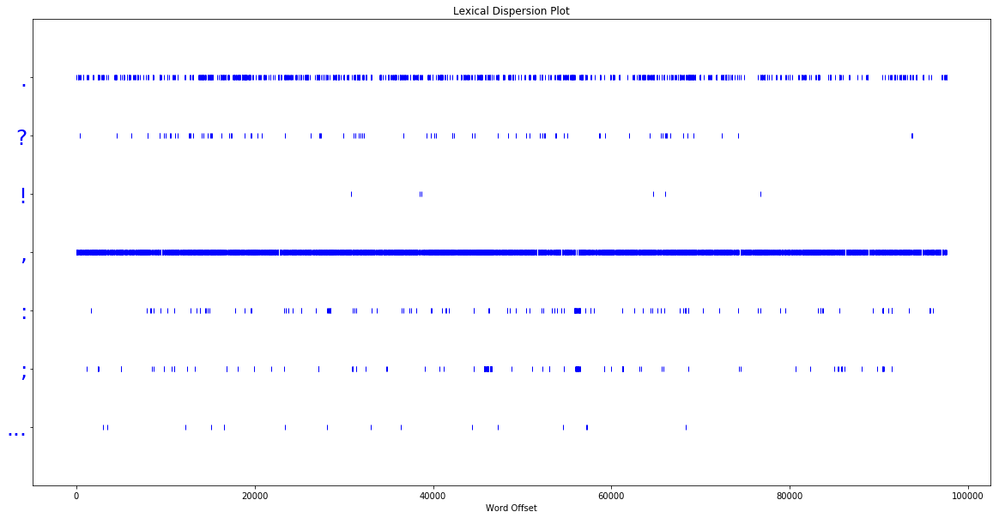

In [43]:
fig = plt.figure(figsize=(20,10))
plt.yticks(fontsize=25);
p = dispersion_plot(word_tokenize(join_treebank),sentence_endings + sentence_pause)

### brown

In [58]:
join_brown = ''
for i,s in enumerate(nltk.corpus.brown.sents()):
    sentence = ' '.join(s)
    join_brown = join_brown + sentence
    print(str(i)+':', sentence)

0: The Fulton County Grand Jury said Friday an investigation of Atlanta's recent primary election produced `` no evidence '' that any irregularities took place .
1: The jury further said in term-end presentments that the City Executive Committee , which had over-all charge of the election , `` deserves the praise and thanks of the City of Atlanta '' for the manner in which the election was conducted .
2: The September-October term jury had been charged by Fulton Superior Court Judge Durwood Pye to investigate reports of possible `` irregularities '' in the hard-fought primary which was won by Mayor-nominate Ivan Allen Jr. .
3: `` Only a relative handful of such reports was received '' , the jury said , `` considering the widespread interest in the election , the number of voters and the size of this city '' .
4: The jury said it did find that many of Georgia's registration and election laws `` are outmoded or inadequate and often ambiguous '' .
5: It recommended that Fulton legislators

866: Victim of the accident was Robert Lee Stansbery , 39 .
867: His widow started the circulation of petitions after Barnard was reprimanded for violating the probation .
868: The City Planning Commission on Tuesday approved agreements between two redevelopers and the Redevelopment Authority for the purchase of land in the $300,000,000 Eastwick Redevelopment Area project .
869: The commission also approved a novel plan that would eliminate traffic hazards for pedestrians in the project .
870: One of the agreements calls for the New Eastwick Corp. to purchase a 1311 acre tract for $12,192,865 .
871: The tract is bounded by Island Ave. , Dicks Ave. , 61st St. , and Eastwick Ave. .
872: Four parks planned
873: It is designated as Stage 1 Residential on the Redevelopment Authority's master plan and will feature row houses , garden apartments , four small parks , schools , churches , a shopping center and several small clusters of stores .
874: The corporation was formed by the Reynolds Me

2130: Walker said he was considering filing a motion for a new trial which would contend that the verdict was against the weight of the evidence and that there were several errors in trial procedure .
2131: Locked in motel
2132: A verdict against Pohl came at 4:05 p.m. after almost 13-1/2 hours of deliberation .
2133: The jury , which was locked up in a motel overnight , was canvassed at the request of Walker after the verdict was announced .
2134: The jury foreman , Mrs. Olive Heideman , of rural Elsie , said that a ballot was not even taken until yesterday morning and that the first day of deliberation was spent in going over the evidence .
2135: She said the jurors agreed that Pohl's confession was valid .
2136: The jury asked Judge Cash to send in his written definition of the difference between first and second-degree murder and manslaughter .
2137: The verdict came three hours later .
2138: Some 30 spectators remained in the court during the day and were on hand to hear the verdi

3242: Steak House has such a run on beer to wash down that Mexican food `` Tex '' Burgess had to call the draft man twice in one day .
3243: ( Which is understandable -- if you've ever sampled the exotic , peppery fare .
3244: )
3245: faces in places
3246: Pualani and Randy Avon , Dave Searles , George ( Papa ) Gill , Al Bandish , Jim Morgart , Bob Neil at the Mouse Trap .
3247: Billy and Jean Moffett at the Rickshaw .
3248: Bea Morley , Jimmy Fazio , Jim O'Hare , Ralph Michaels , Bill and Evelyn Perry at the Escape .
3249: Murphy honors
3250: hear that Patricia Murphy flies up to St. John's Newfoundland , next Sunday to attend the government's special ceremonies at Memorial University honoring distinguished sons and daughters of the island province .
3251: Miss Murphy was born in Placentia , Newfoundland .
3252: Her invitation from Premier Joseph Smallwood is reported to be the only one extended to a woman .
3253: Fort Lauderdale
3254: -- The first in a series of five productions will

4507: Gradual , controlled expansion of the world's textile trade is what President Kennedy wants .
4508: This may point the way toward international stabilization agreements in other products .
4509: It's an important clue to Washington thinking .
4510: Note , too , that the Kennedy textile plan looks toward modernization or shrinkage of the U.S. textile industry .
4511: `` Get competitive or get out '' .
4512: In veiled terms , that's what the Kennedy Administration is saying to the American textile industry .
4513: The Government will help in transferring companies and workers into new lines , where modernization doesn't seem feasible .
4514: Special depreciation on new textile machinery may be allowed .
4515: Government research will look into new products and methods .
4516: Import quotas aren't ruled out where the national interest is involved .
4517: But the Kennedy Administration doesn't favor import quotas .
4518: Rather , they are impressed with the British Government's succe

5741: Paradoxically the council is weakest in areas that register 4- and 5-to-1 in the party's favor , strongest where Democrats and Republicans compete on a fairly even basis .
5742: Like most Democratic spokesmen , Carvey predicts 1962 will be a tremendously `` partisan year '' .
5743: Hence the attention they're lavishing on the Aj .
5744: In all probability , the council will screen and endorse candidates for the Assembly and for Congress , and then strive to put its full weight behind these pre-primary favorites .
5745: This bodes heated contests in several districts where claims have already been staked out by Democratic hopefuls who don't see eye-to-eye with the Aj .
5746: Naturally , the statewide races will provide the major test for the expanding council .
5747: Shunted aside by the rampant organizers for John F. Kennedy last year , who relegated it to a somewhat subordinate role in the Presidential campaign , the CDC plainly intends to provide the party's campaign muscle in 

6991: It could have unilaterally abandoned further testing on the grounds of the radiation hazard to future generations .
6992: It could have continued testing to the full on the grounds that the radiation danger was far less than the danger of Communist world domination .
6993: Or it could have chosen to find -- by negotiation -- some way of stopping the tests without loss to national security .
6994: This third choice was in fact made .
6995: With the resumption of Soviet testing and their intransigence at the Geneva talks , however , the hope that this third choice would prove viable has been shaken .
6996: Once again , the United States must choose .
6997: And once again , the choices are much the same .
6998: Only this time around the conditions are different and the choice is far harder .
6999: The first choice , abandoning tests entirely , would not only be unpopular domestically , but would surely be exploited by the Russians .
7000: The second choice , full testing , has becom

8322: The Couperin `` La Steinkerque '' , with its battle music , brevity , wit and refined simplicity , already shakes off Corelli and points towards the mid-century elegances that ended the baroque era .
8323: If Couperin shows the fashionable trend , the others do so all the more .
8324: All these records have close , attractive sound and the performances by a variety of instrumentalists is characteristic .
8325: Rameau's Six Concerts En Sextuor , recorded by L'orchestre De Chambre Pierre Menet ( BAM LD 046 ) , turn out to be harpsichord pieces arranged for strings apparently by the composer himself .
8326: The strange , delightful little character pieces with their odd and sometimes inexplicable titles are still evocative and gracious .
8327: Maitres Allemands Des 17e et 18e Siecles contains music by Pachelbel , Buxtehude , Rosenmueller and Telemann , well performed by the Ensemble Instrumental Sylvie Spycket ( BAM LD 035 ) .
8328: Rococo music -- a lot of it -- was played in Carne

9522: One hundred years ago there existed in England the Association for the Promotion of the Unity of Christendom .
9523: Representing as it did the efforts of only unauthorized individuals of the Roman and Anglican Churches , and urging a communion of prayer unacceptable to Rome , this association produced little fruit , and , in fact , was condemned by the Holy Office in 1864 .
9524: Now again in 1961 , in England , there is perhaps nothing in the religious sphere so popularly discussed as Christian unity .
9525: The Church Unity Octave , January 18-25 , was enthusiastically devoted to prayer and discussion by the various churches .
9526: Many people seem hopeful , yet it is difficult to predict whether or not there will be any more real attainment of Christian unity in 1961 than there was in 1861 .
9527: But it must be readily seen that the religious picture in England has so greatly changed during these hundred years as to engender hope , at least on the Catholic side .
9528: For 

10903: You may do as you please with God now .
10904: It is permitted .
10905: God placed Himself in men's hands when He sent Jesus Christ into the world as perfect God and perfect Man in one Being .
10906: He was then in man's hands .
10907: They cursed Him .
10908: It was permitted .
10909: Men spit on Him .
10910: God allowed it .
10911: They called Him a devil .
10912: God withheld His wrath .
10913: Finally men arrested Him , gave Him a mock trial , flogged Him , nailed Him on a cross and hung Him between earth and heaven ; ;
10914: and God allowed it .
10915: You can do likewise though Christ is not bodily present .
10916: You can ignore Him .
10917: You can ignore His Book , the Bible , and His church .
10918: You can laugh at His blood-bought salvation , curse His followers , and laugh at hell .
10919: It is permitted .
10920: The eternal Christ may knock at your soul's door , calling you to give up sin and prepare for heaven .
10921: You may refuse Him , spit on Him , call Him

12240: It's the Valmet ( about $170 ) , a 12-gauge over/under very much like the old Remington 32 -- which was so fine a gun that today a used one still brings high prices .
12241: High Standard has also added two models to its line .
12242: The Supermatic Trophy ( prices begin at less than $135 and depend on grade and optional features ) is a 12-gauge auto .
12243: The Flite-King Trophy ( beginning at just over $85 ) is a pump gun in 12 or 16 .
12244: Either model is a very good dollar value .
12245: Mossberg's latest contribution to the field is the Model 500 ( from $73.50 ) ; ;
12246: this is an improved version of the old Model 200 , a pump-action 12-gauge shotgun .
12247: See page 24 for a complete report on it .
12248: Handguns , '61
12249: Aside from the
12250: Jet -- which I coupled with the Deerstalker carbine as one of the year's two biggest developments -- few significant innovations appeared among 1961's handguns .
12251: Livery stable -- J. Vernon , prop. '' .
12252: Coach

13565: Adjoining areas
13566: -- The values of the site may be affected by the appearance of the adjoining lands , ownership and use of the land , and the utilities available there .
13567: For instance , a site adjoining other publicly owned lands , such as a national forest or a public road , may be desirable , whereas a site next to an industrial plant might not .
13568: The utilities available nearby may provide a savings in the cost of extending electricity or water to the site .
13569: Topography
13570: -- Topography is very important .
13571: Check the elevation of the ground , degree and direction of slopes , drainage , rock outcrops , topsoil types and quality , as well as subsoil .
13572: Nearly level areas are required for parking areas , beaches , camp areas , ballfields , etcetera .
13573: Determine how much topography limits useful area or what the costs of earth moving or grading might be .
13574: Water
13575: -- In addition to its recreation interests , water is needed 

14700: Moving around camp we saw all kinds of camp stoves , lanterns , coolers , bedding , games , fishing tackle , windbreaks and sunshades .
14701: We saw similar displays in the other three campgrounds in this 70-mile-long National Seashore Recreation Area .
14702: Dealers would do well to visit such a campground often , look at the equipment and talk with the campers .
14703: Here you begin to appreciate the scope of the challenges and possibilities facing the industry .
14704: Camping is big and getting bigger .
14705: No one knows where it will stop .
14706: Almost every official who reflects on it thinks this movement of Americans to canvas dwellings opens one of the most promising of all outdoor markets .
14707: You read various guesses on how many Americans are camping .
14708: The number depends on who is talking at the moment .
14709: The figures range as high as 15 million families .
14710: I've heard 10 million mentioned often , but I'm more inclined to think there may be 

15789: A great many retired people are the so-called white collar workers .
15790: Are you one of these ? ?
15791: If so , you are of the old school .
15792: You are conscientious , hard working , honest , accurate , a good penman , and a stickler for a job well done , with no loose ends .
15793: Everything must balance to the last penny .
15794: Also you can spell , without consulting a dictionary for every other word .
15795: You never are late for work and seldom absent .
15796: Actually , you can take no special credit for this .
15797: It is the way you were taught and your way of life .
15798: All this is standard equipment for a man of your day ; ;
15799: your stock in trade ; ;
15800: your livelihood .
15801: However , the last few years of your life , things seem to be changing .
15802: Your way doesn't seem to be so darned important any more .
15803: You realize you are getting in the old fogy class .
15804: To put it bluntly , you are getting out-moded .
15805: What's happen

16995: Thomas Douglas , fifth Earl of Selkirk , a noble humanitarian Scot concerned with the plight of the crofters of his native Highlands , conceived a plan to settle them in the valley of the Red River of the North .
16996: Since the land he desired lay within the great northern empire of the Hudson's Bay Company , he purchased great blocks of the Comany's stock with the view to controlling its policies .
16997: Having achieved this end , he was able to buy 116,000 square miles in the valleys of the Red and Assiniboine rivers .
16998: The grant , which stretched southward to Lake Traverse -- the headwaters of the Red -- was made in May , 1811 , and by October of that year a small group of Scots was settling for the winter at York Factory on Hudson Bay .
16999: Thus at the same time that William Henry Harrison was preparing to pacify the aborigines of Indiana Territory and winning fame at the battle of Tippecanoe , Anglo-Saxon settlement made a great leap into the center of the North

18292: `` Washington '' , President Kennedy has been heard to remark ironically , `` is a city of southern efficiency and northern charm '' .
18293: There have been indications that he hopes to redress that situation , commencing with the White House .
18294: One of Mrs. Kennedy's initial concerns as First Lady was the sad state of the furnishings in a building which is supposed to be a national shrine .
18295: Ever since the fire of 1812 destroyed the beautiful furniture assembled by President Thomas Jefferson , the White House has collected a hodgepodge of period pieces , few of them authentic or aesthetic .
18296: Mrs. Kennedy shows a determination to change all this .
18297: Not long after moving in she turned up a richly carved desk , hewed from the timbers of the British ship H.M.S. Resolute and presented to President Hayes by Queen Victoria .
18298: It now serves the President in his oval office .
18299: Later , browsing in an old issue of the Gazette Des Beaux-Arts , she found 

19587: Now , I do not doubt that , among the people at the U.N. that day , there were Stalinist and professional revolutionists acting out of the most cynical motives .
19588: Wherever there is great social discontent , these people are , sooner or later , to be found .
19589: Their presence is not as frightening as the discontent which creates their opportunity .
19590: What I find appalling -- and really dangerous -- is the American assumption that the Negro is so contented with his lot here that only the cynical agents of a foreign power can rouse him to protest .
19591: It is a notion which contains a gratuitous insult , implying , as it does , that Negroes can make no move unless they are manipulated .
19592: Color was delayed until 1935 , the wide screen until the early fifties .
19593: Movement itself was the chief and often the only attraction of the primitive movies of the nineties .
19594: Each film consisted of fifty feet , which gives a running time of about one minute on t

20880: To support his large family Hamilton went back to the law after each spell of public service .
20881: Talleyrand passed his New York law office one night on the way to a party .
20882: Hamilton was bent over his desk , drafting a legal paper by the light of a candle .
20883: The Frenchman was astonished .
20884: `` I have just come from viewing a man who had made the fortune of his country , but now is working all night in order to support his family '' , he reflected .
20885: All seven combined ardent devotion to the cause of revolution with a profound respect for legality .
20886: John Adams asserted in the Continental Congress' Declaration of Rights that the demands of the colonies were in accordance with their charters , the British Constitution and the common law , and Jefferson appealed in the Declaration of Independence `` to the tribunal of the world '' for support of a revolution justified by `` the laws of nature and of nature's God '' .
20887: They fought hard , but t

22269: Adlai Stevenson expressed some reservations about this return .
22270: Others invoked technology and common sense .
22271: Only Walter Lippman envisioned the possibility of our having `` outlived most of what we used to regard as the program of our national purposes '' .
22272: But the most notable thing about the incantation of these ex-liberals was that the one-time shibboleth of socialism was conspicuously absent .
22273: The second specific comment was the report of Eisenhower's Commission on National Goals , titled Goals For Americans .
22274: They , perhaps , gave the pitch of their position in the preface where it was said that Eisenhower requested that the Commission be administered by the American Assembly of Columbia University , because it was non-partisan .
22275: The Commission seems to represent the viewpoint of what I would call the unconscious liberal , but not unconscious enough , to invoke the now taboo symbolism of socialism .
22276: And here again we hear the

23564: America possesses an enormous defense power .
23565: It is my studied conviction that no nation will ever risk general war against us unless we should become so foolish as to neglect the defense forces we now so powerfully support .
23566: It is world-wide knowledge that any power which might be tempted today to attack the United States by surprise , even though we might sustain great losses , would itself promptly suffer a terrible destruction .
23567: But I once again assure all peoples and all nations that the United States , except in defense , will never turn loose this destructive power .
23568: During the past year , our long-range striking power , unmatched today in manned bombers , has taken on new strength as the Atlas intercontinental ballistic missile has entered the operational inventory .
23569: In fourteen recent test launchings , at ranges of five thousand miles , Atlas has been striking on an average within two miles of the target .
23570: This is less than the 

24810: As it began raining at around eight o'clock on December 26th , I retired into my tent early , somewhat tired and discouraged , my body reacting sluggishly because of the continued exposure .
24811: No matter how large the fire , I couldn't seem to shake off the chill that day .
24812: `` Oh , Mr. Davis , are you there '' ? ?
24813: A voice drifted in to me above the patter of the rain shortly after I had fallen into a fitful sleep .
24814: `` Who is it '' ? ?
24815: `` We're from the Council of Europe , British delegation .
24816: May we have a word with you '' ? ?
24817: `` I'm sorry .
24818: I've had a trying day and I just can't make it out again '' , I told them .
24819: I heard nothing more .
24820: Later I learned that Sir Hugh Dalton had expressed a desire to see me , hence their trip to `` No Man's Land '' .
24821: On the evening of December 27th , Esther noticed my pallid look and rasping voice .
24822: She entreated me to see a doctor , and when I refused , brought one

25937: These shifts in alliance and allegiance not only increased the difficulties confronting the English embassy as a whole , but also directly involved the two Savoyards , Amadee and Othon .
25938: In spite of the armistice negotiated by Amadee two years earlier , the war between Bishop Guillaume of Lausanne and Louis of Savoy was still going on , and although little is known about it , that little proves that it was yet another phase of the struggle against French expansion and was closely interwoven with the larger conflict .
25939: A second truce had been arbitrated in April , 1298 , by Jean D'Arlay , lord of Chalon-sur-Saone , the most staunch of Edward's Burgundian allies , and these last were represented in the discussions at the Curia by Gautier de Montfaucon , Othon's neighbor and a member of the Vaudois coalition .
25940: But although in many of these discussions Othon and Amadee might have been tempted to consider their own interests as well as those of the king , Edward's

27237: He mentions the beats only once '' , when he refers to their having revived through mere power and abandonment and the unwillingness to , commit death in life some idea of a decent equivalent between verbal expression and actual experience , , but the entire narrative , is written in the tiresome vocabulary `` of '' that lost `` and '' dying cause , `` and in the '' `` sprung syntax that is supposed to supplant , our mother , tongue .
27238: Krim's ( aesthetic combines anti-intellectualism , conscious and unconscious naivete ) '' , and a winsome reliance `` upon the '' , natural and upon experience .
27239: Ideas are the thruway to nowhere .
27240: My `` touchstones , had , been strictly '' literature and , humanly enough , American literature ( because that was what I wanted to write ) .
27241: He alludes to something called direct writing , and he finds that criticism gets in the way of his truer , realer , imaginative bounce .
27242: There had been signs and portents like the

28582: The Commission shall complete its affairs in connection with settlement of United States-Yugoslav claims arising under the Yugoslav Claims Agreement of 1948 not later than December 31 , 1954 : :
28583: Provided , That nothing in this provision shall be construed to limit the life of the Commission , or its authority to act on future agreements which may be effected under the provisions of this legislation .
28584: Sec. 7 .
28585: ( A )
28586: Subject to the limitations hereinafter provided , the Secretary of the Treasury is authorized and directed to pay , as prescribed by Section 8 of this Title , an amount not exceeding the principal of each award , plus accrued interests on such awards as bear interest , certified pursuant to Section 5 of this Title , in accordance with the award .
28587: Such payments , and applications for such payments , shall be made in accordance with such regulations as the Secretary of the Treasury may prescribe .
28588: ( B )
28589: There shall be ded

29814: Sick pay , if included in your Gross Income , is deducted in arriving at Adjusted Gross Income .
29815: If your sick pay is not included in your Gross Income , you may not deduct it .
29816: ( See Chapter 9 .
29817: ) income from estates and trusts .
29818: If you are a life tenant , you deduct allowable depreciation and depletion .
29819: If you are an income beneficiary of property held in trust or an heir , legatee , or devisee , you may deduct allowable depreciation and depletion , if not deductible by the estate or trust .
29820: Deductible losses on sales or exchanges of property are allowable in determining your Adjusted Gross Income .
29821: ( See Chapter 20 .
29822: ) 50% of capital gains .
29823: You also deduct 50% of the excess of net long-term capital gains over net short-term capital losses in determining Adjusted Gross Income .
29824: ( See Chapter 24 .
29825: ) other deductions .
29826: Certain other deductions are not allowed in determining Adjusted Gross Income

31026: The flux of micrometeorites in the neighborhood of the Earth can be estimated by extrapolation from radar and visual meteor data .
31027: A summary of meteorite data , prepared by Whipple ( 1958 ) on the basis of photographic , visual , and radar evidence , is given in Table 5-1 .
31028: From an estimated mass of 25 g for a zero-magnitude meteorite , the other masses are derived with the assumption of a mass decrease by a factor of 2.512 for each unit increase in magnitude .
31029: The radius is calculated from the mass by assuming spheres of density Af except for the smallest particles , which must have a higher mass density to remain in the solar system in the presence of solar-radiation pressure .
31030: The flux values are for all particles with masses greater than the given mass and are based on an estimate of the numbers of visual meteors .
31031: It is assumed that the flux values increase by a factor of 2.512 per magnitude , in accordance with the opinion that the total 

32236: These words are more expressive than labels like `` A '' and `` not-A '' .
32237: It is natural from the marksman's viewpoint to call a bull's-eye a success , but in the mice example it is arbitrary which category corresponds to straight hair in a mouse .
32238: The word `` binomial '' means `` of two names '' or `` of two terms '' , and both usages apply in our work : the first to the names of the two outcomes of a binomial trial , and the second to the terms P and Af that represent the probabilities of `` success '' and `` failure '' .
32239: Sometimes when there are many outcomes for a single trial , we group these outcomes into two classes , as in the example of the die , where we have arbitrarily constructed the classes `` ace '' and `` not-ace '' .
32240: Experiment without the two-class property .
32241: We classify mice as `` straight-haired '' or `` wavy-haired '' , but a hairless mouse appears .
32242: We can escape from such a difficulty by ruling out the animal as no

33279: Another use of roleplaying for evaluation illustrates how this procedure can be used in real life situations without special equipment or special assistants during the daily course of work .
33280: The position of receptionist was opened in a large office and an announcement was made to the other girls already working that they could apply for this job which had higher prestige and slightly higher salary than typing and clerking positions .
33281: All applicants were generally familiar with the work of the receptionist .
33282: At the end of work one day , the personnel man took the applicants one at a time , asked them to sit behind the receptionist's desk and he then played the role of a number of people who might come to the receptionist with a number of queries and for a number of purposes .
33283: Each girl was independently `` tested '' by the personnel man , and he served not only as the director , but as the antagonist and the observer .
33284: Somewhat to his surprise h

34359: To appreciate this development , we must relate it to other aspects of nineteenth-century philosophy .
34360: First , and most obvious , was the growing nationalism and the tendency to regard the state , and the individual's identification with the state , as transcending other ties of social solidarity .
34361: National identification was not new , but it was accelerating in intensity and scope throughout Europe as new unifications occurred .
34362: It reached its ultimate philosophical statement in notions of `` state will '' put forward by the Germans , especially by Hegel , although political philosophers will recognize its origins in the rejected doctrines of Hobbes .
34363: National identification was reflected jurisprudentially in law theories which incorporated this Hegelian abstraction and saw law , domestic and international , simply as its formal reflection .
34364: In the international community this reduced law to Jellinek's auto-limitation .
34365: A state , the hi

35485: Since writing was practiced in the Aegean before the end of the century , we may hope that the details of tradition will now be occasionally useful .
35486: Though it is not easy to apply the evidence of the Iliad to any specific era , this marvelous product of the epic tradition had certainly taken definitive shape by 750 .
35487: The Dipylon Geometric pottery of Athens and the Iliad are amazing manifestations of the inherent potentialities of Greek civilization ; ;
35488: but both were among the last products of a phase which was ending .
35489: Greek civilization was swirling toward its great revolution , in which the developed qualities of the Hellenic outlook were suddenly to break forth .
35490: The revolution was well under way before 700 B.C. , and premonitory signs go back virtually across the century .
35491: The era , however , is Janus-faced .
35492: While many tokens point forward , the main achievements stand as a culmination of the simple patterns of the Dark ages

36735: We first see him shaking Mrs. Joe's hand on discovering the sizable amount of the premium paid to her husband for Pip's indenture as an apprentice and later pumping Pip's hands `` for the hundredth time at least '' ( `` May I -- may I -- '' ? ?
36736: ) in effusive congratulation to Pip on his expectations .
36737: We take leave of Pumblechook as he gloats over Pip's loss of fortune , extending his hand `` with a magnificently forgiving air '' and exhibiting `` the same fat five fingers '' , one of which he identifies with `` the finger of Providence '' and shakes at Pip in a canting imputation of the latter's `` ingratitoode '' and his own generosity as Pip's `` earliest benefactor '' .
36738: Pip first learns `` the stupendous power of money '' from the sycophantic tailor , Mr. Trabb , whose brutality to his boy helper exactly matches the financial resource of each new customer , and whose fawning hands touch `` the outside of each elbow '' and `` rub '' Pip out of the shop .


38128: The input axis of the X gyro , when pointing in the east-west direction , is always perpendicular to the spin axis of earth .
38129: If the platform is not properly headed , the X-gyro input axis will see a component of the earth's rotation .
38130: The sensing of this rotation by the X gyro can be utilized to direct the platform into proper heading .
38131: In Fig. 7-4 , the input axis of the three-axis platform is shown at some point on the earth .
38132: The point is at a latitude **yl , and the platform is at an error in heading east .
38133: The earth is spinning at an angular velocity **zq equal to one revolution per 24 hr. .
38134: When the platform is level , **ye is a rotation about the Z axis of the platform Af .
38135: Since the earth is rotating and the unleveled gyro-stabilized platform is fixed with respect to a reference in space , an observer on the earth will see the platform rotating ( with respect to the earth ) .
38136: Thirty-three
38137: Scotty did not go b

39484: I have observed that being up on a horse changes the whole character of a man , and when a very small man is up on a saddle , he'd like as not prefer to eat his meals there .
39485: That's understandable , and I appreciate the sentiment .
39486: As for this rider , I never saw him before or afterwards and never saw him dismounted , so whether he stood tall or short in his shoes , I can't say ; ;
39487: but I do know that he gave the day tone and distinction .
39488: The last thing in the world that resembled a war was our line of farmers and storekeepers and mechanics perched on top of a stone wall , and this dashing rider made us feel a good deal sharper and more alert to the situation .
39489: We came down off the wall as if he had toppled all of us , and we crouched behind it .
39490: I have heard people talk with contempt about the British regulars , but that only proves that a lot of people talk about things of which they are deplorably ignorant .
39491: Whatever we felt ab

40628: Andrei stopped at Litowski Place and looked around quickly at the boundary of civil buildings .
40629: His watch told him he was still early .
40630: Down the boulevard he could see a portion of the ghetto wall .
40631: He found an empty bench , opened a newspaper , and stretched his legs before him .
40632: Krakow Boulevard was filled with black Nazi uniforms and the dirty brownish ones of their Auxiliaries .
40633: `` Captain Androfski '' ! !
40634: Andrei glanced up over the top of the paper and looked into the mustached , homely face of Sergeant Styka .
40635: Styka sat beside him and pumped his hand excitedly .
40636: `` I have been waiting across the street at the post office since dawn .
40637: I thought you might get in on a morning train '' .
40638: `` It's good to see you again , Styka '' .
40639: Styka studied his captain .
40640: He almost broke into tears .
40641: To him , Andrei Androfski had always been the living symbol of a Polish officer .
40642: His captain wa

42080: he rose to put his greatcoat on and addressed Alex in a muted voice .
42081: `` Have you got our keys handy '' ? ?
42082: `` Right in my pocket '' .
42083: `` All right .
42084: Now you go outside and beckon me when it's safe '' .
42085: The hall was empty and Alex beckoned ; ;
42086: they climbed the stairs which creaked , very loudly to their sensitive ears , and reached the next floor .
42087: A guest was locking his room ; ;
42088: they passed behind him and got to Alex's room unnoticed .
42089: The doctor sat down rather wearily , caressing the hen and remarking that the city was not the place for a poultry-loving man , but no sooner was the remark out than a knock at this door obliged him to cover the hen with his greatcoat once more .
42090: At the door Alex managed to persuade the increasingly astonished fille de chambre to return in ten minutes .
42091: It was evident that a second transfer had to be effected , and that it had to take place between the time the fille fi

43441: Hank was beginning to feel sharp concern for Mr. Black .
43442: If Mrs. Black was who he thought she was , Mr. Black's Peerless selling days might well be over .
43443: Now for their exodus from Gulf Springs .
43444: This time the search took twice as long , cutting down on his extra reading , for he had to pick through several columns of one- and two-line social notes in each issue .
43445: He found it in the edition of May 15 .
43446: The item said Mr. and Mrs. Black had moved to Jackson , his home town -- so the lovely Lisa had been with him a year ago .
43447: Next on his program was a call to the Jackson office of Peerless Business Machines to find out if Vincent Black was still with them -- or , more specifically , still with us .
43448: He glanced at his watch , saw it was only seven , and decided to indulge his weakness now .
43449: For the next hour he scrambled happily up and down the ladder , sharing the excitement of reporters who had seen McKinley's assassination , 

44733: The secretary's tone indicated that an appointment at such short notice was a concession for which Madden should be duly grateful .
44734: He inferred that Hohlbein and Garth were high-priced lawyers .
44735: He had lunch with Pauling .
44736: Promptly at one-thirty he entered Hohlbein and Garth's elegant suite of offices in Medfield's newest professional building .
44737: He disliked Garth on sight , conservative clothes and haircut , smile a shade too earnestly boyish for a man who must be well into his thirties , handclasp too consciously quick and firm .
44738: Youngish man on the make , Madden labeled him , and was ready to guess that in a correct , not too pushing fashion , the junior partner of the firm had political ambitions ; ;
44739: that Mrs. Garth would be impeccably suitable as the wife of a rising young lawyer ; ;
44740: that there were three children , two boys and a girl ; ;
44741: that she was active in the Woman's Club and he in Lions , Rotary , and Jaycee ; ;

45983: I believe in returning favors .
45984: I'll do anything for somebody I like .
45985: It won't cost you a cent , Phil .
45986: Go ahead and try me '' ! !
45987: Phil rubbed his forehead wearily .
45988: He was beginning to feel woolly .
45989: Maybe it would be better to humor the guy and then make an exit .
45990: He really didn't expect anything to come of it , and there were a few people
45991: `` All right '' , he conceded finally , `` if you must know , I don't get along with the landlord .
45992: He keeps riding me because I like to listen to the radio and sing while I'm taking a bath .
45993: He says the neighbors complain , but I don't believe it .
45994: Why don't they tell me themselves if it bothers them '' ? ?
45995: The man closed his eyes and nodded .
45996: When he looked up again , he seemed almost contented .
45997: `` Fine .
45998: Give me your address .
45999: It will take a little time .
46000: I want to study your landlord's habits and movements first .
46001

47421: Clayton choked , shook his head , murmuring , `` No '' .
47422: `` Come here '' .
47423: The old man beckoned with one finger and Clayton went forward to him .
47424: Gavin slipped his arms around his chest and hugged him fiercely .
47425: `` All my life '' , he said , `` I tried .
47426: I tried .
47427: I saw you driftin away -- but I tried .
47428: And you wanted no part of me when I had so much to give .
47429: Now there's nothin left of me .
47430: Laurel is gone , my men are gone , Ed is dead -- and you come to me , to help me .
47431: Oh ! !
47432: God in Heaven , I can't refuse you now .
47433: That would mock me too much ! !
47434: Can't let you go way from me again '' He closed his eyes , ashamed of his tears .
47435: `` I'll go , Clay '' .
47436: Clayton freed himself from the embrace and stepped back .
47437: The eyes followed him fearfully .
47438: `` The horses .
47439: There isn't much time .
47440: I'll saddle the horses and bring them round .
47441: You get read

48793: She wondered what had taken place in town , between him and his wife .
48794: She wished that she could talk to her mother about it .
48795: Not that her mother knew what had happened , but they could speculate upon it .
48796: But her mother would rebuke her if she mentioned it , and say that it was none of her concern .
48797: `` Pat , get out of that creek ! !
48798: You too , Sean ! !
48799: Elena , you'll get mud all over your dress '' ! !
48800: Even as she called to the children , Conchita let her gaze seek Tom Brannon .
48801: Tomas , she called him -- as the Mexican hands did .
48802: He was in earnest conversation with her father and the old vaquero , Luis Hernandez .
48803: Whatever they are talking about ? ?
48804: Conchita wondered .
48805: It bothered her that she probably would never know .
48806: Certainly , she wouldn't dare ask her father afterward .
48807: He would tell her not to pry into grownups' affairs -- as though she were a little kid like Elena ! !
488

50232: He used the blanket for late morning naps when hosts of the night had gone off to jobs and proved reluctant to leave him in their small rooms with their few possessions .
50233: Mary Jane Lerner knew none of this .
50234: ) Her Nicolas lay curled in the sun like a fawn , black hair falling over his eyes .
50235: She was telling herself that this might just be her reward at the end of a long meaningful search for truth .
50236: This was surely a reunion in art , it was all that poetry promised .
50237: That long night with Nicolas and marijuana in Venice had opened her eyes .
50238: His advice , his voice saying his poems , the fact that he had not so much as touched her -- on the contrary , he had put his head back and she had stroked his hair -- this was all new .
50239: Her eyes had opened , she had caught a glimpse of a new faith .
50240: The next day he was gone .
50241: Mary Jane might not be the most intelligent woman , but she was one of the most determined .
50242: Even 

51529: `` Me neither '' , others said , and soon the game broke up , the children going off in pairs , in larger groups and alone .
51530: Jack walked off alone out the road in the searing midday sun , past Robert Allen's three-room , tarpapered house , toward the field where the other boys were playing ball , thinking of what he would do in order to make Miss Langford have him stay in after school -- because this was the day he had decided when he thought he saw the look in her eyes .
51531: When he came back to the schoolhouse , his mind was made up .
51532: He simply would not work his arithmetic problems when the teacher held his class .
51533: That should do it , he thought , because Miss Langford had said she was going to be strict about school work .
51534: He had considered throwing erasers or flipping paperwads at someone or pulling the hair of the girl sitting in front of him , but he couldn't take a chance on either of these possibilities : the teacher probably would make hi

52651: Owen found Buzz watching chuck-a-luck .
52652: Buzz had on a Hawaiian shirt and was carrying some sun-tan oil and dark glasses .
52653: He was shorter and fatter than Owen , who felt good standing next to him .
52654: `` We're all going over to Lake Tahoe and try our luck at Cal-Neva '' , Buzz explained , still instigating .
52655: `` We ran into a guy at the Pagan Room who guarantees we can beat the wheel .
52656: He started out as a stickman , then became a pit boss until the Club found him crossroading .
52657: He was knocking down checks at faro '' .
52658: `` I'm allergic to Tahoe '' , Owen explained .
52659: `` Something about the pollen '' .
52660: `` Well , okay '' , Buzz said .
52661: `` We'll see you around later '' .
52662: Owen went over to the crap table and the dice were hot , but he couldn't pyramid with any consecutive success .
52663: `` How's your luck , honey '' ? ?
52664: A short platinum blonde in a bursting sun-suit addressed him .
52665: She looked well-fe

54222: You saw them always together those years .
54223: You talked about John-and-Linda as an entity .
54224: John-and-Linda were at Longue Vue last night ; ;
54225: John-and-Linda drove to Conneaut in three and a half hours .
54226: Then there was a spat over something , as there had been lovers' spats before ; ;
54227: only this one didn't heal .
54228: You still said `` John-and-Linda '' , but as if you were speaking of a national catastrophe such as the depression or Dillinger .
54229: It got worse instead of better .
54230: First , it came out after Mr. Cooper's will was settled -- he had died the year before -- that John and his mother weren't rich any more .
54231: And then there was Linda's engagement to Bobbie Evans .
54232: There was no connection between the two events , because Bobbie wasn't rich , either , though he was more aggressive than John .
54233: He was a bright and handsome young man from New York , who worked for the same steel company as John did .
54234: Some 

55481: `` Now listen to me , Phil .
55482: I'm not steering you wrong .
55483: You haven't got the heart for baseball '' .
55484: Phil shook his head and Eddie frowned .
55485: Suddenly his voice grew hard .
55486: `` What the hell do you think baseball is ? ?
55487: You're not in the big leagues , but if you can't give and take down here what the hell do you think it'll be like up there '' ? ?
55488: Phil started to say something but Eddie cut him short .
55489: `` Now don't tell me what a good ball player you are .
55490: I know you've got talent .
55491: But what you haven't got is the heart to back up that talent with .
55492: The heart , Phil .
55493: You just haven't got the heart for pro-ball , and that's it '' .
55494: Dazed , Phil said : `` I don't get it .
55495: My batting average ''
55496: Eddie stood up abruptly , then sat down just as abruptly .
55497: `` What difference does your batting average make ? ?
55498: Or your fielding average .
55499: Or even the way you run ba

56884: `` I'll try '' , I said , and sat for a moment thinking .
56885: `` Oh yes , the other day I reread some of Emerson's English Traits , and there was an anecdote about a group of English and Americans visiting Germany , more than a hundred years ago .
56886: In the railway station at Berlin , a uniformed attendant was chanting , ' Foreigners this way ! !
56887: Foreigners this way ' ! !
56888: One woman -- she could have been either English or American -- went up to him and said , ' But you are the foreigners ' '' .
56889: I took a deep breath and an even deeper swallow of my drink , and said , `` I admit that going back to Ralph Waldo Emerson for humor is like going to a modern musical comedy for music and comedy '' .
56890: `` What's the matter with the music '' ? ?
56891: Moreland asked .
56892: `` It doesn't drown out the dialogue '' , I explained .
56893: `` Let's talk about books '' , Moreland said .
56894: `` I am told that in America you have non-books by non-writers , br

In [45]:
fdist_brown = FreqDist()
fdist_brown = FreqDist(word.lower() for word in word_tokenize(join_brown))
fdist_brown

FreqDist({'the': 63678, ',': 58336, 'of': 36281, 'and': 28123, 'to': 25780, 'a': 22209, 'in': 19682, '``': 17537, 'that': 10483, 'is': 10173, ...})

In [46]:
print('Occurrence of each important punctuation sign on brown corpus')
for k in fdist_brown.keys():
    if k in sentence_endings + sentence_pause:
        print(k,fdist_brown[k])

Occurrence of each important punctuation sign on brown corpus
, 58336
. 5481
: 1786
? 4694
; 5566
! 1597


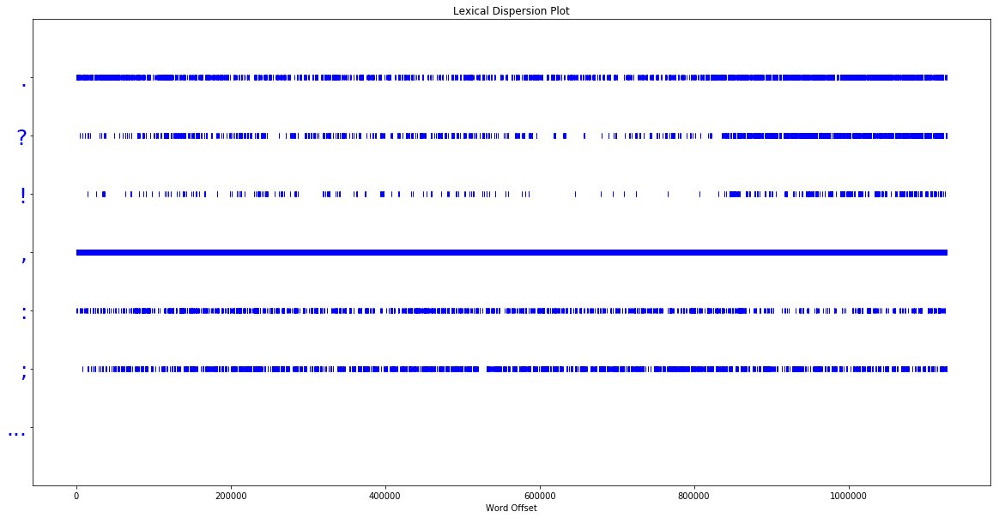

In [15]:
fig = plt.figure(figsize=(20,10))
plt.yticks(fontsize=25);
p = dispersion_plot(word_tokenize(join_brown),sentence_endings + sentence_pause)

#### Categories:

Brown classifies the text by categories. These are the 15 **categories** included:

In [51]:
print(brown.categories())

['adventure', 'belles_lettres', 'editorial', 'fiction', 'government', 'hobbies', 'humor', 'learned', 'lore', 'mystery', 'news', 'religion', 'reviews', 'romance', 'science_fiction']


#### Learned category

For selecting descritive/realist texts, we are particularly interested in the **category 'learned'**: 

In [66]:
learnFiles = brown.fileids(categories='learned')
print('últimos 10 archivos en learned:', learnFiles[-10:])

últimos 10 archivos en learned: ['cj71', 'cj72', 'cj73', 'cj74', 'cj75', 'cj76', 'cj77', 'cj78', 'cj79', 'cj80']


In [60]:
print(f'There are {len(learnFiles)} files labeled as learned')
# print(len(brown.fileids(categories='learned')))

There are 80 files labeled as learned


In [25]:
text = brown.sents(categories='learned')
print(f'The number of sentences in this category is: {len(text)}')

The number of sentences in this category is: 7734


This is enough for the experiments we might run.

In a future second step we might be also interested in 'fiction', 'science-fiction', 'news'; and maybe 'lore', 'hobbies' and 'religion'. 

In [58]:
join_brown = ''
for i,s in enumerate(nltk.corpus.brown.sents()):
    sentence = ' '.join(s)
    join_brown = join_brown + sentence
    print(str(i)+':', sentence)

0: The Fulton County Grand Jury said Friday an investigation of Atlanta's recent primary election produced `` no evidence '' that any irregularities took place .
1: The jury further said in term-end presentments that the City Executive Committee , which had over-all charge of the election , `` deserves the praise and thanks of the City of Atlanta '' for the manner in which the election was conducted .
2: The September-October term jury had been charged by Fulton Superior Court Judge Durwood Pye to investigate reports of possible `` irregularities '' in the hard-fought primary which was won by Mayor-nominate Ivan Allen Jr. .
3: `` Only a relative handful of such reports was received '' , the jury said , `` considering the widespread interest in the election , the number of voters and the size of this city '' .
4: The jury said it did find that many of Georgia's registration and election laws `` are outmoded or inadequate and often ambiguous '' .
5: It recommended that Fulton legislators

866: Victim of the accident was Robert Lee Stansbery , 39 .
867: His widow started the circulation of petitions after Barnard was reprimanded for violating the probation .
868: The City Planning Commission on Tuesday approved agreements between two redevelopers and the Redevelopment Authority for the purchase of land in the $300,000,000 Eastwick Redevelopment Area project .
869: The commission also approved a novel plan that would eliminate traffic hazards for pedestrians in the project .
870: One of the agreements calls for the New Eastwick Corp. to purchase a 1311 acre tract for $12,192,865 .
871: The tract is bounded by Island Ave. , Dicks Ave. , 61st St. , and Eastwick Ave. .
872: Four parks planned
873: It is designated as Stage 1 Residential on the Redevelopment Authority's master plan and will feature row houses , garden apartments , four small parks , schools , churches , a shopping center and several small clusters of stores .
874: The corporation was formed by the Reynolds Me

2130: Walker said he was considering filing a motion for a new trial which would contend that the verdict was against the weight of the evidence and that there were several errors in trial procedure .
2131: Locked in motel
2132: A verdict against Pohl came at 4:05 p.m. after almost 13-1/2 hours of deliberation .
2133: The jury , which was locked up in a motel overnight , was canvassed at the request of Walker after the verdict was announced .
2134: The jury foreman , Mrs. Olive Heideman , of rural Elsie , said that a ballot was not even taken until yesterday morning and that the first day of deliberation was spent in going over the evidence .
2135: She said the jurors agreed that Pohl's confession was valid .
2136: The jury asked Judge Cash to send in his written definition of the difference between first and second-degree murder and manslaughter .
2137: The verdict came three hours later .
2138: Some 30 spectators remained in the court during the day and were on hand to hear the verdi

3242: Steak House has such a run on beer to wash down that Mexican food `` Tex '' Burgess had to call the draft man twice in one day .
3243: ( Which is understandable -- if you've ever sampled the exotic , peppery fare .
3244: )
3245: faces in places
3246: Pualani and Randy Avon , Dave Searles , George ( Papa ) Gill , Al Bandish , Jim Morgart , Bob Neil at the Mouse Trap .
3247: Billy and Jean Moffett at the Rickshaw .
3248: Bea Morley , Jimmy Fazio , Jim O'Hare , Ralph Michaels , Bill and Evelyn Perry at the Escape .
3249: Murphy honors
3250: hear that Patricia Murphy flies up to St. John's Newfoundland , next Sunday to attend the government's special ceremonies at Memorial University honoring distinguished sons and daughters of the island province .
3251: Miss Murphy was born in Placentia , Newfoundland .
3252: Her invitation from Premier Joseph Smallwood is reported to be the only one extended to a woman .
3253: Fort Lauderdale
3254: -- The first in a series of five productions will

4507: Gradual , controlled expansion of the world's textile trade is what President Kennedy wants .
4508: This may point the way toward international stabilization agreements in other products .
4509: It's an important clue to Washington thinking .
4510: Note , too , that the Kennedy textile plan looks toward modernization or shrinkage of the U.S. textile industry .
4511: `` Get competitive or get out '' .
4512: In veiled terms , that's what the Kennedy Administration is saying to the American textile industry .
4513: The Government will help in transferring companies and workers into new lines , where modernization doesn't seem feasible .
4514: Special depreciation on new textile machinery may be allowed .
4515: Government research will look into new products and methods .
4516: Import quotas aren't ruled out where the national interest is involved .
4517: But the Kennedy Administration doesn't favor import quotas .
4518: Rather , they are impressed with the British Government's succe

5741: Paradoxically the council is weakest in areas that register 4- and 5-to-1 in the party's favor , strongest where Democrats and Republicans compete on a fairly even basis .
5742: Like most Democratic spokesmen , Carvey predicts 1962 will be a tremendously `` partisan year '' .
5743: Hence the attention they're lavishing on the Aj .
5744: In all probability , the council will screen and endorse candidates for the Assembly and for Congress , and then strive to put its full weight behind these pre-primary favorites .
5745: This bodes heated contests in several districts where claims have already been staked out by Democratic hopefuls who don't see eye-to-eye with the Aj .
5746: Naturally , the statewide races will provide the major test for the expanding council .
5747: Shunted aside by the rampant organizers for John F. Kennedy last year , who relegated it to a somewhat subordinate role in the Presidential campaign , the CDC plainly intends to provide the party's campaign muscle in 

6991: It could have unilaterally abandoned further testing on the grounds of the radiation hazard to future generations .
6992: It could have continued testing to the full on the grounds that the radiation danger was far less than the danger of Communist world domination .
6993: Or it could have chosen to find -- by negotiation -- some way of stopping the tests without loss to national security .
6994: This third choice was in fact made .
6995: With the resumption of Soviet testing and their intransigence at the Geneva talks , however , the hope that this third choice would prove viable has been shaken .
6996: Once again , the United States must choose .
6997: And once again , the choices are much the same .
6998: Only this time around the conditions are different and the choice is far harder .
6999: The first choice , abandoning tests entirely , would not only be unpopular domestically , but would surely be exploited by the Russians .
7000: The second choice , full testing , has becom

8322: The Couperin `` La Steinkerque '' , with its battle music , brevity , wit and refined simplicity , already shakes off Corelli and points towards the mid-century elegances that ended the baroque era .
8323: If Couperin shows the fashionable trend , the others do so all the more .
8324: All these records have close , attractive sound and the performances by a variety of instrumentalists is characteristic .
8325: Rameau's Six Concerts En Sextuor , recorded by L'orchestre De Chambre Pierre Menet ( BAM LD 046 ) , turn out to be harpsichord pieces arranged for strings apparently by the composer himself .
8326: The strange , delightful little character pieces with their odd and sometimes inexplicable titles are still evocative and gracious .
8327: Maitres Allemands Des 17e et 18e Siecles contains music by Pachelbel , Buxtehude , Rosenmueller and Telemann , well performed by the Ensemble Instrumental Sylvie Spycket ( BAM LD 035 ) .
8328: Rococo music -- a lot of it -- was played in Carne

9522: One hundred years ago there existed in England the Association for the Promotion of the Unity of Christendom .
9523: Representing as it did the efforts of only unauthorized individuals of the Roman and Anglican Churches , and urging a communion of prayer unacceptable to Rome , this association produced little fruit , and , in fact , was condemned by the Holy Office in 1864 .
9524: Now again in 1961 , in England , there is perhaps nothing in the religious sphere so popularly discussed as Christian unity .
9525: The Church Unity Octave , January 18-25 , was enthusiastically devoted to prayer and discussion by the various churches .
9526: Many people seem hopeful , yet it is difficult to predict whether or not there will be any more real attainment of Christian unity in 1961 than there was in 1861 .
9527: But it must be readily seen that the religious picture in England has so greatly changed during these hundred years as to engender hope , at least on the Catholic side .
9528: For 

10903: You may do as you please with God now .
10904: It is permitted .
10905: God placed Himself in men's hands when He sent Jesus Christ into the world as perfect God and perfect Man in one Being .
10906: He was then in man's hands .
10907: They cursed Him .
10908: It was permitted .
10909: Men spit on Him .
10910: God allowed it .
10911: They called Him a devil .
10912: God withheld His wrath .
10913: Finally men arrested Him , gave Him a mock trial , flogged Him , nailed Him on a cross and hung Him between earth and heaven ; ;
10914: and God allowed it .
10915: You can do likewise though Christ is not bodily present .
10916: You can ignore Him .
10917: You can ignore His Book , the Bible , and His church .
10918: You can laugh at His blood-bought salvation , curse His followers , and laugh at hell .
10919: It is permitted .
10920: The eternal Christ may knock at your soul's door , calling you to give up sin and prepare for heaven .
10921: You may refuse Him , spit on Him , call Him

12240: It's the Valmet ( about $170 ) , a 12-gauge over/under very much like the old Remington 32 -- which was so fine a gun that today a used one still brings high prices .
12241: High Standard has also added two models to its line .
12242: The Supermatic Trophy ( prices begin at less than $135 and depend on grade and optional features ) is a 12-gauge auto .
12243: The Flite-King Trophy ( beginning at just over $85 ) is a pump gun in 12 or 16 .
12244: Either model is a very good dollar value .
12245: Mossberg's latest contribution to the field is the Model 500 ( from $73.50 ) ; ;
12246: this is an improved version of the old Model 200 , a pump-action 12-gauge shotgun .
12247: See page 24 for a complete report on it .
12248: Handguns , '61
12249: Aside from the
12250: Jet -- which I coupled with the Deerstalker carbine as one of the year's two biggest developments -- few significant innovations appeared among 1961's handguns .
12251: Livery stable -- J. Vernon , prop. '' .
12252: Coach

13565: Adjoining areas
13566: -- The values of the site may be affected by the appearance of the adjoining lands , ownership and use of the land , and the utilities available there .
13567: For instance , a site adjoining other publicly owned lands , such as a national forest or a public road , may be desirable , whereas a site next to an industrial plant might not .
13568: The utilities available nearby may provide a savings in the cost of extending electricity or water to the site .
13569: Topography
13570: -- Topography is very important .
13571: Check the elevation of the ground , degree and direction of slopes , drainage , rock outcrops , topsoil types and quality , as well as subsoil .
13572: Nearly level areas are required for parking areas , beaches , camp areas , ballfields , etcetera .
13573: Determine how much topography limits useful area or what the costs of earth moving or grading might be .
13574: Water
13575: -- In addition to its recreation interests , water is needed 

14700: Moving around camp we saw all kinds of camp stoves , lanterns , coolers , bedding , games , fishing tackle , windbreaks and sunshades .
14701: We saw similar displays in the other three campgrounds in this 70-mile-long National Seashore Recreation Area .
14702: Dealers would do well to visit such a campground often , look at the equipment and talk with the campers .
14703: Here you begin to appreciate the scope of the challenges and possibilities facing the industry .
14704: Camping is big and getting bigger .
14705: No one knows where it will stop .
14706: Almost every official who reflects on it thinks this movement of Americans to canvas dwellings opens one of the most promising of all outdoor markets .
14707: You read various guesses on how many Americans are camping .
14708: The number depends on who is talking at the moment .
14709: The figures range as high as 15 million families .
14710: I've heard 10 million mentioned often , but I'm more inclined to think there may be 

15789: A great many retired people are the so-called white collar workers .
15790: Are you one of these ? ?
15791: If so , you are of the old school .
15792: You are conscientious , hard working , honest , accurate , a good penman , and a stickler for a job well done , with no loose ends .
15793: Everything must balance to the last penny .
15794: Also you can spell , without consulting a dictionary for every other word .
15795: You never are late for work and seldom absent .
15796: Actually , you can take no special credit for this .
15797: It is the way you were taught and your way of life .
15798: All this is standard equipment for a man of your day ; ;
15799: your stock in trade ; ;
15800: your livelihood .
15801: However , the last few years of your life , things seem to be changing .
15802: Your way doesn't seem to be so darned important any more .
15803: You realize you are getting in the old fogy class .
15804: To put it bluntly , you are getting out-moded .
15805: What's happen

16995: Thomas Douglas , fifth Earl of Selkirk , a noble humanitarian Scot concerned with the plight of the crofters of his native Highlands , conceived a plan to settle them in the valley of the Red River of the North .
16996: Since the land he desired lay within the great northern empire of the Hudson's Bay Company , he purchased great blocks of the Comany's stock with the view to controlling its policies .
16997: Having achieved this end , he was able to buy 116,000 square miles in the valleys of the Red and Assiniboine rivers .
16998: The grant , which stretched southward to Lake Traverse -- the headwaters of the Red -- was made in May , 1811 , and by October of that year a small group of Scots was settling for the winter at York Factory on Hudson Bay .
16999: Thus at the same time that William Henry Harrison was preparing to pacify the aborigines of Indiana Territory and winning fame at the battle of Tippecanoe , Anglo-Saxon settlement made a great leap into the center of the North

18292: `` Washington '' , President Kennedy has been heard to remark ironically , `` is a city of southern efficiency and northern charm '' .
18293: There have been indications that he hopes to redress that situation , commencing with the White House .
18294: One of Mrs. Kennedy's initial concerns as First Lady was the sad state of the furnishings in a building which is supposed to be a national shrine .
18295: Ever since the fire of 1812 destroyed the beautiful furniture assembled by President Thomas Jefferson , the White House has collected a hodgepodge of period pieces , few of them authentic or aesthetic .
18296: Mrs. Kennedy shows a determination to change all this .
18297: Not long after moving in she turned up a richly carved desk , hewed from the timbers of the British ship H.M.S. Resolute and presented to President Hayes by Queen Victoria .
18298: It now serves the President in his oval office .
18299: Later , browsing in an old issue of the Gazette Des Beaux-Arts , she found 

19587: Now , I do not doubt that , among the people at the U.N. that day , there were Stalinist and professional revolutionists acting out of the most cynical motives .
19588: Wherever there is great social discontent , these people are , sooner or later , to be found .
19589: Their presence is not as frightening as the discontent which creates their opportunity .
19590: What I find appalling -- and really dangerous -- is the American assumption that the Negro is so contented with his lot here that only the cynical agents of a foreign power can rouse him to protest .
19591: It is a notion which contains a gratuitous insult , implying , as it does , that Negroes can make no move unless they are manipulated .
19592: Color was delayed until 1935 , the wide screen until the early fifties .
19593: Movement itself was the chief and often the only attraction of the primitive movies of the nineties .
19594: Each film consisted of fifty feet , which gives a running time of about one minute on t

20880: To support his large family Hamilton went back to the law after each spell of public service .
20881: Talleyrand passed his New York law office one night on the way to a party .
20882: Hamilton was bent over his desk , drafting a legal paper by the light of a candle .
20883: The Frenchman was astonished .
20884: `` I have just come from viewing a man who had made the fortune of his country , but now is working all night in order to support his family '' , he reflected .
20885: All seven combined ardent devotion to the cause of revolution with a profound respect for legality .
20886: John Adams asserted in the Continental Congress' Declaration of Rights that the demands of the colonies were in accordance with their charters , the British Constitution and the common law , and Jefferson appealed in the Declaration of Independence `` to the tribunal of the world '' for support of a revolution justified by `` the laws of nature and of nature's God '' .
20887: They fought hard , but t

22269: Adlai Stevenson expressed some reservations about this return .
22270: Others invoked technology and common sense .
22271: Only Walter Lippman envisioned the possibility of our having `` outlived most of what we used to regard as the program of our national purposes '' .
22272: But the most notable thing about the incantation of these ex-liberals was that the one-time shibboleth of socialism was conspicuously absent .
22273: The second specific comment was the report of Eisenhower's Commission on National Goals , titled Goals For Americans .
22274: They , perhaps , gave the pitch of their position in the preface where it was said that Eisenhower requested that the Commission be administered by the American Assembly of Columbia University , because it was non-partisan .
22275: The Commission seems to represent the viewpoint of what I would call the unconscious liberal , but not unconscious enough , to invoke the now taboo symbolism of socialism .
22276: And here again we hear the

23564: America possesses an enormous defense power .
23565: It is my studied conviction that no nation will ever risk general war against us unless we should become so foolish as to neglect the defense forces we now so powerfully support .
23566: It is world-wide knowledge that any power which might be tempted today to attack the United States by surprise , even though we might sustain great losses , would itself promptly suffer a terrible destruction .
23567: But I once again assure all peoples and all nations that the United States , except in defense , will never turn loose this destructive power .
23568: During the past year , our long-range striking power , unmatched today in manned bombers , has taken on new strength as the Atlas intercontinental ballistic missile has entered the operational inventory .
23569: In fourteen recent test launchings , at ranges of five thousand miles , Atlas has been striking on an average within two miles of the target .
23570: This is less than the 

24810: As it began raining at around eight o'clock on December 26th , I retired into my tent early , somewhat tired and discouraged , my body reacting sluggishly because of the continued exposure .
24811: No matter how large the fire , I couldn't seem to shake off the chill that day .
24812: `` Oh , Mr. Davis , are you there '' ? ?
24813: A voice drifted in to me above the patter of the rain shortly after I had fallen into a fitful sleep .
24814: `` Who is it '' ? ?
24815: `` We're from the Council of Europe , British delegation .
24816: May we have a word with you '' ? ?
24817: `` I'm sorry .
24818: I've had a trying day and I just can't make it out again '' , I told them .
24819: I heard nothing more .
24820: Later I learned that Sir Hugh Dalton had expressed a desire to see me , hence their trip to `` No Man's Land '' .
24821: On the evening of December 27th , Esther noticed my pallid look and rasping voice .
24822: She entreated me to see a doctor , and when I refused , brought one

25937: These shifts in alliance and allegiance not only increased the difficulties confronting the English embassy as a whole , but also directly involved the two Savoyards , Amadee and Othon .
25938: In spite of the armistice negotiated by Amadee two years earlier , the war between Bishop Guillaume of Lausanne and Louis of Savoy was still going on , and although little is known about it , that little proves that it was yet another phase of the struggle against French expansion and was closely interwoven with the larger conflict .
25939: A second truce had been arbitrated in April , 1298 , by Jean D'Arlay , lord of Chalon-sur-Saone , the most staunch of Edward's Burgundian allies , and these last were represented in the discussions at the Curia by Gautier de Montfaucon , Othon's neighbor and a member of the Vaudois coalition .
25940: But although in many of these discussions Othon and Amadee might have been tempted to consider their own interests as well as those of the king , Edward's

27237: He mentions the beats only once '' , when he refers to their having revived through mere power and abandonment and the unwillingness to , commit death in life some idea of a decent equivalent between verbal expression and actual experience , , but the entire narrative , is written in the tiresome vocabulary `` of '' that lost `` and '' dying cause , `` and in the '' `` sprung syntax that is supposed to supplant , our mother , tongue .
27238: Krim's ( aesthetic combines anti-intellectualism , conscious and unconscious naivete ) '' , and a winsome reliance `` upon the '' , natural and upon experience .
27239: Ideas are the thruway to nowhere .
27240: My `` touchstones , had , been strictly '' literature and , humanly enough , American literature ( because that was what I wanted to write ) .
27241: He alludes to something called direct writing , and he finds that criticism gets in the way of his truer , realer , imaginative bounce .
27242: There had been signs and portents like the

28582: The Commission shall complete its affairs in connection with settlement of United States-Yugoslav claims arising under the Yugoslav Claims Agreement of 1948 not later than December 31 , 1954 : :
28583: Provided , That nothing in this provision shall be construed to limit the life of the Commission , or its authority to act on future agreements which may be effected under the provisions of this legislation .
28584: Sec. 7 .
28585: ( A )
28586: Subject to the limitations hereinafter provided , the Secretary of the Treasury is authorized and directed to pay , as prescribed by Section 8 of this Title , an amount not exceeding the principal of each award , plus accrued interests on such awards as bear interest , certified pursuant to Section 5 of this Title , in accordance with the award .
28587: Such payments , and applications for such payments , shall be made in accordance with such regulations as the Secretary of the Treasury may prescribe .
28588: ( B )
28589: There shall be ded

29814: Sick pay , if included in your Gross Income , is deducted in arriving at Adjusted Gross Income .
29815: If your sick pay is not included in your Gross Income , you may not deduct it .
29816: ( See Chapter 9 .
29817: ) income from estates and trusts .
29818: If you are a life tenant , you deduct allowable depreciation and depletion .
29819: If you are an income beneficiary of property held in trust or an heir , legatee , or devisee , you may deduct allowable depreciation and depletion , if not deductible by the estate or trust .
29820: Deductible losses on sales or exchanges of property are allowable in determining your Adjusted Gross Income .
29821: ( See Chapter 20 .
29822: ) 50% of capital gains .
29823: You also deduct 50% of the excess of net long-term capital gains over net short-term capital losses in determining Adjusted Gross Income .
29824: ( See Chapter 24 .
29825: ) other deductions .
29826: Certain other deductions are not allowed in determining Adjusted Gross Income

31026: The flux of micrometeorites in the neighborhood of the Earth can be estimated by extrapolation from radar and visual meteor data .
31027: A summary of meteorite data , prepared by Whipple ( 1958 ) on the basis of photographic , visual , and radar evidence , is given in Table 5-1 .
31028: From an estimated mass of 25 g for a zero-magnitude meteorite , the other masses are derived with the assumption of a mass decrease by a factor of 2.512 for each unit increase in magnitude .
31029: The radius is calculated from the mass by assuming spheres of density Af except for the smallest particles , which must have a higher mass density to remain in the solar system in the presence of solar-radiation pressure .
31030: The flux values are for all particles with masses greater than the given mass and are based on an estimate of the numbers of visual meteors .
31031: It is assumed that the flux values increase by a factor of 2.512 per magnitude , in accordance with the opinion that the total 

32236: These words are more expressive than labels like `` A '' and `` not-A '' .
32237: It is natural from the marksman's viewpoint to call a bull's-eye a success , but in the mice example it is arbitrary which category corresponds to straight hair in a mouse .
32238: The word `` binomial '' means `` of two names '' or `` of two terms '' , and both usages apply in our work : the first to the names of the two outcomes of a binomial trial , and the second to the terms P and Af that represent the probabilities of `` success '' and `` failure '' .
32239: Sometimes when there are many outcomes for a single trial , we group these outcomes into two classes , as in the example of the die , where we have arbitrarily constructed the classes `` ace '' and `` not-ace '' .
32240: Experiment without the two-class property .
32241: We classify mice as `` straight-haired '' or `` wavy-haired '' , but a hairless mouse appears .
32242: We can escape from such a difficulty by ruling out the animal as no

33279: Another use of roleplaying for evaluation illustrates how this procedure can be used in real life situations without special equipment or special assistants during the daily course of work .
33280: The position of receptionist was opened in a large office and an announcement was made to the other girls already working that they could apply for this job which had higher prestige and slightly higher salary than typing and clerking positions .
33281: All applicants were generally familiar with the work of the receptionist .
33282: At the end of work one day , the personnel man took the applicants one at a time , asked them to sit behind the receptionist's desk and he then played the role of a number of people who might come to the receptionist with a number of queries and for a number of purposes .
33283: Each girl was independently `` tested '' by the personnel man , and he served not only as the director , but as the antagonist and the observer .
33284: Somewhat to his surprise h

34359: To appreciate this development , we must relate it to other aspects of nineteenth-century philosophy .
34360: First , and most obvious , was the growing nationalism and the tendency to regard the state , and the individual's identification with the state , as transcending other ties of social solidarity .
34361: National identification was not new , but it was accelerating in intensity and scope throughout Europe as new unifications occurred .
34362: It reached its ultimate philosophical statement in notions of `` state will '' put forward by the Germans , especially by Hegel , although political philosophers will recognize its origins in the rejected doctrines of Hobbes .
34363: National identification was reflected jurisprudentially in law theories which incorporated this Hegelian abstraction and saw law , domestic and international , simply as its formal reflection .
34364: In the international community this reduced law to Jellinek's auto-limitation .
34365: A state , the hi

35485: Since writing was practiced in the Aegean before the end of the century , we may hope that the details of tradition will now be occasionally useful .
35486: Though it is not easy to apply the evidence of the Iliad to any specific era , this marvelous product of the epic tradition had certainly taken definitive shape by 750 .
35487: The Dipylon Geometric pottery of Athens and the Iliad are amazing manifestations of the inherent potentialities of Greek civilization ; ;
35488: but both were among the last products of a phase which was ending .
35489: Greek civilization was swirling toward its great revolution , in which the developed qualities of the Hellenic outlook were suddenly to break forth .
35490: The revolution was well under way before 700 B.C. , and premonitory signs go back virtually across the century .
35491: The era , however , is Janus-faced .
35492: While many tokens point forward , the main achievements stand as a culmination of the simple patterns of the Dark ages

36735: We first see him shaking Mrs. Joe's hand on discovering the sizable amount of the premium paid to her husband for Pip's indenture as an apprentice and later pumping Pip's hands `` for the hundredth time at least '' ( `` May I -- may I -- '' ? ?
36736: ) in effusive congratulation to Pip on his expectations .
36737: We take leave of Pumblechook as he gloats over Pip's loss of fortune , extending his hand `` with a magnificently forgiving air '' and exhibiting `` the same fat five fingers '' , one of which he identifies with `` the finger of Providence '' and shakes at Pip in a canting imputation of the latter's `` ingratitoode '' and his own generosity as Pip's `` earliest benefactor '' .
36738: Pip first learns `` the stupendous power of money '' from the sycophantic tailor , Mr. Trabb , whose brutality to his boy helper exactly matches the financial resource of each new customer , and whose fawning hands touch `` the outside of each elbow '' and `` rub '' Pip out of the shop .


38128: The input axis of the X gyro , when pointing in the east-west direction , is always perpendicular to the spin axis of earth .
38129: If the platform is not properly headed , the X-gyro input axis will see a component of the earth's rotation .
38130: The sensing of this rotation by the X gyro can be utilized to direct the platform into proper heading .
38131: In Fig. 7-4 , the input axis of the three-axis platform is shown at some point on the earth .
38132: The point is at a latitude **yl , and the platform is at an error in heading east .
38133: The earth is spinning at an angular velocity **zq equal to one revolution per 24 hr. .
38134: When the platform is level , **ye is a rotation about the Z axis of the platform Af .
38135: Since the earth is rotating and the unleveled gyro-stabilized platform is fixed with respect to a reference in space , an observer on the earth will see the platform rotating ( with respect to the earth ) .
38136: Thirty-three
38137: Scotty did not go b

39484: I have observed that being up on a horse changes the whole character of a man , and when a very small man is up on a saddle , he'd like as not prefer to eat his meals there .
39485: That's understandable , and I appreciate the sentiment .
39486: As for this rider , I never saw him before or afterwards and never saw him dismounted , so whether he stood tall or short in his shoes , I can't say ; ;
39487: but I do know that he gave the day tone and distinction .
39488: The last thing in the world that resembled a war was our line of farmers and storekeepers and mechanics perched on top of a stone wall , and this dashing rider made us feel a good deal sharper and more alert to the situation .
39489: We came down off the wall as if he had toppled all of us , and we crouched behind it .
39490: I have heard people talk with contempt about the British regulars , but that only proves that a lot of people talk about things of which they are deplorably ignorant .
39491: Whatever we felt ab

40628: Andrei stopped at Litowski Place and looked around quickly at the boundary of civil buildings .
40629: His watch told him he was still early .
40630: Down the boulevard he could see a portion of the ghetto wall .
40631: He found an empty bench , opened a newspaper , and stretched his legs before him .
40632: Krakow Boulevard was filled with black Nazi uniforms and the dirty brownish ones of their Auxiliaries .
40633: `` Captain Androfski '' ! !
40634: Andrei glanced up over the top of the paper and looked into the mustached , homely face of Sergeant Styka .
40635: Styka sat beside him and pumped his hand excitedly .
40636: `` I have been waiting across the street at the post office since dawn .
40637: I thought you might get in on a morning train '' .
40638: `` It's good to see you again , Styka '' .
40639: Styka studied his captain .
40640: He almost broke into tears .
40641: To him , Andrei Androfski had always been the living symbol of a Polish officer .
40642: His captain wa

42080: he rose to put his greatcoat on and addressed Alex in a muted voice .
42081: `` Have you got our keys handy '' ? ?
42082: `` Right in my pocket '' .
42083: `` All right .
42084: Now you go outside and beckon me when it's safe '' .
42085: The hall was empty and Alex beckoned ; ;
42086: they climbed the stairs which creaked , very loudly to their sensitive ears , and reached the next floor .
42087: A guest was locking his room ; ;
42088: they passed behind him and got to Alex's room unnoticed .
42089: The doctor sat down rather wearily , caressing the hen and remarking that the city was not the place for a poultry-loving man , but no sooner was the remark out than a knock at this door obliged him to cover the hen with his greatcoat once more .
42090: At the door Alex managed to persuade the increasingly astonished fille de chambre to return in ten minutes .
42091: It was evident that a second transfer had to be effected , and that it had to take place between the time the fille fi

43441: Hank was beginning to feel sharp concern for Mr. Black .
43442: If Mrs. Black was who he thought she was , Mr. Black's Peerless selling days might well be over .
43443: Now for their exodus from Gulf Springs .
43444: This time the search took twice as long , cutting down on his extra reading , for he had to pick through several columns of one- and two-line social notes in each issue .
43445: He found it in the edition of May 15 .
43446: The item said Mr. and Mrs. Black had moved to Jackson , his home town -- so the lovely Lisa had been with him a year ago .
43447: Next on his program was a call to the Jackson office of Peerless Business Machines to find out if Vincent Black was still with them -- or , more specifically , still with us .
43448: He glanced at his watch , saw it was only seven , and decided to indulge his weakness now .
43449: For the next hour he scrambled happily up and down the ladder , sharing the excitement of reporters who had seen McKinley's assassination , 

44733: The secretary's tone indicated that an appointment at such short notice was a concession for which Madden should be duly grateful .
44734: He inferred that Hohlbein and Garth were high-priced lawyers .
44735: He had lunch with Pauling .
44736: Promptly at one-thirty he entered Hohlbein and Garth's elegant suite of offices in Medfield's newest professional building .
44737: He disliked Garth on sight , conservative clothes and haircut , smile a shade too earnestly boyish for a man who must be well into his thirties , handclasp too consciously quick and firm .
44738: Youngish man on the make , Madden labeled him , and was ready to guess that in a correct , not too pushing fashion , the junior partner of the firm had political ambitions ; ;
44739: that Mrs. Garth would be impeccably suitable as the wife of a rising young lawyer ; ;
44740: that there were three children , two boys and a girl ; ;
44741: that she was active in the Woman's Club and he in Lions , Rotary , and Jaycee ; ;

45983: I believe in returning favors .
45984: I'll do anything for somebody I like .
45985: It won't cost you a cent , Phil .
45986: Go ahead and try me '' ! !
45987: Phil rubbed his forehead wearily .
45988: He was beginning to feel woolly .
45989: Maybe it would be better to humor the guy and then make an exit .
45990: He really didn't expect anything to come of it , and there were a few people
45991: `` All right '' , he conceded finally , `` if you must know , I don't get along with the landlord .
45992: He keeps riding me because I like to listen to the radio and sing while I'm taking a bath .
45993: He says the neighbors complain , but I don't believe it .
45994: Why don't they tell me themselves if it bothers them '' ? ?
45995: The man closed his eyes and nodded .
45996: When he looked up again , he seemed almost contented .
45997: `` Fine .
45998: Give me your address .
45999: It will take a little time .
46000: I want to study your landlord's habits and movements first .
46001

47421: Clayton choked , shook his head , murmuring , `` No '' .
47422: `` Come here '' .
47423: The old man beckoned with one finger and Clayton went forward to him .
47424: Gavin slipped his arms around his chest and hugged him fiercely .
47425: `` All my life '' , he said , `` I tried .
47426: I tried .
47427: I saw you driftin away -- but I tried .
47428: And you wanted no part of me when I had so much to give .
47429: Now there's nothin left of me .
47430: Laurel is gone , my men are gone , Ed is dead -- and you come to me , to help me .
47431: Oh ! !
47432: God in Heaven , I can't refuse you now .
47433: That would mock me too much ! !
47434: Can't let you go way from me again '' He closed his eyes , ashamed of his tears .
47435: `` I'll go , Clay '' .
47436: Clayton freed himself from the embrace and stepped back .
47437: The eyes followed him fearfully .
47438: `` The horses .
47439: There isn't much time .
47440: I'll saddle the horses and bring them round .
47441: You get read

48793: She wondered what had taken place in town , between him and his wife .
48794: She wished that she could talk to her mother about it .
48795: Not that her mother knew what had happened , but they could speculate upon it .
48796: But her mother would rebuke her if she mentioned it , and say that it was none of her concern .
48797: `` Pat , get out of that creek ! !
48798: You too , Sean ! !
48799: Elena , you'll get mud all over your dress '' ! !
48800: Even as she called to the children , Conchita let her gaze seek Tom Brannon .
48801: Tomas , she called him -- as the Mexican hands did .
48802: He was in earnest conversation with her father and the old vaquero , Luis Hernandez .
48803: Whatever they are talking about ? ?
48804: Conchita wondered .
48805: It bothered her that she probably would never know .
48806: Certainly , she wouldn't dare ask her father afterward .
48807: He would tell her not to pry into grownups' affairs -- as though she were a little kid like Elena ! !
488

50232: He used the blanket for late morning naps when hosts of the night had gone off to jobs and proved reluctant to leave him in their small rooms with their few possessions .
50233: Mary Jane Lerner knew none of this .
50234: ) Her Nicolas lay curled in the sun like a fawn , black hair falling over his eyes .
50235: She was telling herself that this might just be her reward at the end of a long meaningful search for truth .
50236: This was surely a reunion in art , it was all that poetry promised .
50237: That long night with Nicolas and marijuana in Venice had opened her eyes .
50238: His advice , his voice saying his poems , the fact that he had not so much as touched her -- on the contrary , he had put his head back and she had stroked his hair -- this was all new .
50239: Her eyes had opened , she had caught a glimpse of a new faith .
50240: The next day he was gone .
50241: Mary Jane might not be the most intelligent woman , but she was one of the most determined .
50242: Even 

51529: `` Me neither '' , others said , and soon the game broke up , the children going off in pairs , in larger groups and alone .
51530: Jack walked off alone out the road in the searing midday sun , past Robert Allen's three-room , tarpapered house , toward the field where the other boys were playing ball , thinking of what he would do in order to make Miss Langford have him stay in after school -- because this was the day he had decided when he thought he saw the look in her eyes .
51531: When he came back to the schoolhouse , his mind was made up .
51532: He simply would not work his arithmetic problems when the teacher held his class .
51533: That should do it , he thought , because Miss Langford had said she was going to be strict about school work .
51534: He had considered throwing erasers or flipping paperwads at someone or pulling the hair of the girl sitting in front of him , but he couldn't take a chance on either of these possibilities : the teacher probably would make hi

52651: Owen found Buzz watching chuck-a-luck .
52652: Buzz had on a Hawaiian shirt and was carrying some sun-tan oil and dark glasses .
52653: He was shorter and fatter than Owen , who felt good standing next to him .
52654: `` We're all going over to Lake Tahoe and try our luck at Cal-Neva '' , Buzz explained , still instigating .
52655: `` We ran into a guy at the Pagan Room who guarantees we can beat the wheel .
52656: He started out as a stickman , then became a pit boss until the Club found him crossroading .
52657: He was knocking down checks at faro '' .
52658: `` I'm allergic to Tahoe '' , Owen explained .
52659: `` Something about the pollen '' .
52660: `` Well , okay '' , Buzz said .
52661: `` We'll see you around later '' .
52662: Owen went over to the crap table and the dice were hot , but he couldn't pyramid with any consecutive success .
52663: `` How's your luck , honey '' ? ?
52664: A short platinum blonde in a bursting sun-suit addressed him .
52665: She looked well-fe

54222: You saw them always together those years .
54223: You talked about John-and-Linda as an entity .
54224: John-and-Linda were at Longue Vue last night ; ;
54225: John-and-Linda drove to Conneaut in three and a half hours .
54226: Then there was a spat over something , as there had been lovers' spats before ; ;
54227: only this one didn't heal .
54228: You still said `` John-and-Linda '' , but as if you were speaking of a national catastrophe such as the depression or Dillinger .
54229: It got worse instead of better .
54230: First , it came out after Mr. Cooper's will was settled -- he had died the year before -- that John and his mother weren't rich any more .
54231: And then there was Linda's engagement to Bobbie Evans .
54232: There was no connection between the two events , because Bobbie wasn't rich , either , though he was more aggressive than John .
54233: He was a bright and handsome young man from New York , who worked for the same steel company as John did .
54234: Some 

55481: `` Now listen to me , Phil .
55482: I'm not steering you wrong .
55483: You haven't got the heart for baseball '' .
55484: Phil shook his head and Eddie frowned .
55485: Suddenly his voice grew hard .
55486: `` What the hell do you think baseball is ? ?
55487: You're not in the big leagues , but if you can't give and take down here what the hell do you think it'll be like up there '' ? ?
55488: Phil started to say something but Eddie cut him short .
55489: `` Now don't tell me what a good ball player you are .
55490: I know you've got talent .
55491: But what you haven't got is the heart to back up that talent with .
55492: The heart , Phil .
55493: You just haven't got the heart for pro-ball , and that's it '' .
55494: Dazed , Phil said : `` I don't get it .
55495: My batting average ''
55496: Eddie stood up abruptly , then sat down just as abruptly .
55497: `` What difference does your batting average make ? ?
55498: Or your fielding average .
55499: Or even the way you run ba

56884: `` I'll try '' , I said , and sat for a moment thinking .
56885: `` Oh yes , the other day I reread some of Emerson's English Traits , and there was an anecdote about a group of English and Americans visiting Germany , more than a hundred years ago .
56886: In the railway station at Berlin , a uniformed attendant was chanting , ' Foreigners this way ! !
56887: Foreigners this way ' ! !
56888: One woman -- she could have been either English or American -- went up to him and said , ' But you are the foreigners ' '' .
56889: I took a deep breath and an even deeper swallow of my drink , and said , `` I admit that going back to Ralph Waldo Emerson for humor is like going to a modern musical comedy for music and comedy '' .
56890: `` What's the matter with the music '' ? ?
56891: Moreland asked .
56892: `` It doesn't drown out the dialogue '' , I explained .
56893: `` Let's talk about books '' , Moreland said .
56894: `` I am told that in America you have non-books by non-writers , br

In [45]:
fdist_brown = FreqDist()
fdist_brown = FreqDist(word.lower() for word in word_tokenize(join_brown))
fdist_brown

FreqDist({'the': 63678, ',': 58336, 'of': 36281, 'and': 28123, 'to': 25780, 'a': 22209, 'in': 19682, '``': 17537, 'that': 10483, 'is': 10173, ...})

In [46]:
print('Occurrence of each important punctuation sign on brown corpus')
for k in fdist_brown.keys():
    if k in sentence_endings + sentence_pause:
        print(k,fdist_brown[k])

Occurrence of each important punctuation sign on brown corpus
, 58336
. 5481
: 1786
? 4694
; 5566
! 1597


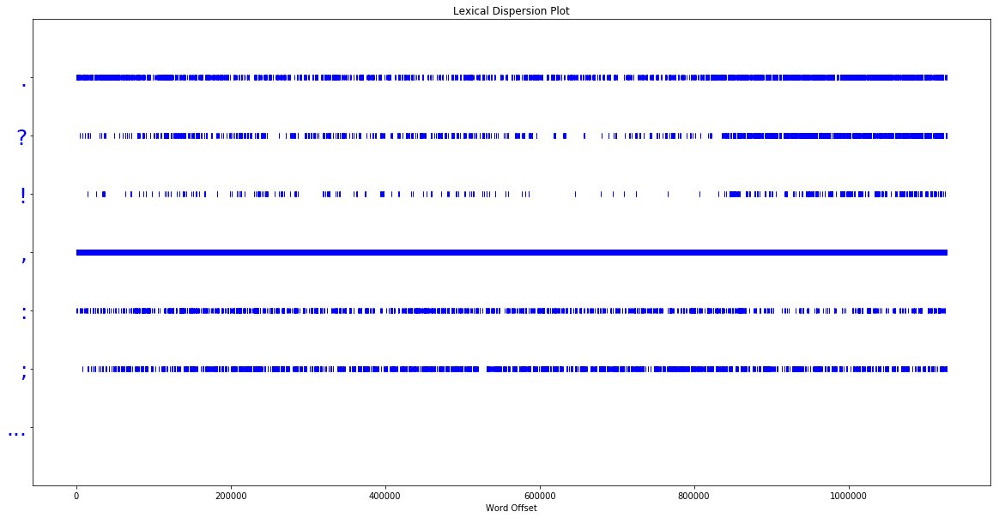

In [15]:
fig = plt.figure(figsize=(20,10))
plt.yticks(fontsize=25);
p = dispersion_plot(word_tokenize(join_brown),sentence_endings + sentence_pause)

## Machine learning for NPL


We said that sentence segmentation can be viewed as a **classification task** for punctuation. So, what the ML algorithm does is that whenever we encounter a symbol that could possibly end a sentence, such as a period or a question mark, it has to decide whether it terminates the text after the previous punctuation sign or not.

So we will first obtain some data that has already been segmented into sentences and convert it into a form suitable for extracting features:

### With the treebank corpus:

The NLTK corpus collection includes a sample of Penn Treebank data, including the raw Wall Street Journal text:  
`nltk.corpus.treebank_raw.raw()`  
(for it's tokenized version: `nltk.corpus.treebank.words()` )
We will try in two different corpus but both including factual texts. 

Lets **tokenize** it (each token is a word or a sign) and create a set of indexes of all sentence-**boundary** tokens:

In [16]:
nltk.corpus.treebank_raw.raw()[:800]

'.START \n\nPierre Vinken, 61 years old, will join the board as a nonexecutive director Nov. 29.\nMr. Vinken is chairman of Elsevier N.V., the Dutch publishing group. \n\n.START \n\nRudolph Agnew, 55 years old and former chairman of Consolidated Gold Fields PLC, was named a nonexecutive director of this British industrial conglomerate. \n\n.START \n\nA form of asbestos once used to make Kent cigarette filters has caused a high percentage of cancer deaths among a group of workers exposed to it more than 30 years ago, researchers reported. \n\nThe asbestos fiber, crocidolite, is unusually resilient once it enters the lungs, with even brief exposures to it causing symptoms that show up decades later, researchers said.\nLorillard Inc., the unit of New York-based Loews Corp. that makes Kent cigarettes, stoppe'

In [17]:
sents = nltk.corpus.treebank.sents()
print('SENTENCES: ', sents[:12]) # Without the slice, it prints just the first line with '...'

tokens = []
boundaries = set()

move = 0
for sent in sents:
    tokens.extend(sent) # Extend doesn't 'append' the whole sent as a single element, it adds a list elem for each elm in sent  
    move += len(sent)
    boundaries.add(move-1)
    
print('TOKENS: ', tokens[:60])
print('BOUNDAS: ', boundaries) # boundaries is a not subscriptable object

SENTENCES:  [['Pierre', 'Vinken', ',', '61', 'years', 'old', ',', 'will', 'join', 'the', 'board', 'as', 'a', 'nonexecutive', 'director', 'Nov.', '29', '.'], ['Mr.', 'Vinken', 'is', 'chairman', 'of', 'Elsevier', 'N.V.', ',', 'the', 'Dutch', 'publishing', 'group', '.'], ['Rudolph', 'Agnew', ',', '55', 'years', 'old', 'and', 'former', 'chairman', 'of', 'Consolidated', 'Gold', 'Fields', 'PLC', ',', 'was', 'named', '*-1', 'a', 'nonexecutive', 'director', 'of', 'this', 'British', 'industrial', 'conglomerate', '.'], ['A', 'form', 'of', 'asbestos', 'once', 'used', '*', '*', 'to', 'make', 'Kent', 'cigarette', 'filters', 'has', 'caused', 'a', 'high', 'percentage', 'of', 'cancer', 'deaths', 'among', 'a', 'group', 'of', 'workers', 'exposed', '*', 'to', 'it', 'more', 'than', '30', 'years', 'ago', ',', 'researchers', 'reported', '0', '*T*-1', '.'], ['The', 'asbestos', 'fiber', ',', 'crocidolite', ',', 'is', 'unusually', 'resilient', 'once', 'it', 'enters', 'the', 'lungs', ',', 'with', 'even', 'brief

**Boundaries** is a set containing the indexes of all sentence-boundary tokens. 

Now we need to specify the **features** of the data that will be used in order to decide whether punctuation indicates a sentence-boundary:

In [18]:
#Feature extractor:

def punct_features(tokens, i):
    return {'nextWordCapitalized': tokens[i+1][0].isupper(),
        'prevWord': tokens[i-1].lower(),
        'punct': tokens[i],
        'prevWordis1Char': len(tokens[i-1]) == 1}

Based on this feature extractor, we can **create a list of labeled featuresets** by selecting all the punctuation tokens, and tagging whether they are boundary tokens or not:

In [19]:
featuresets1 = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in '.?!']
#     Used in Punkt Sentence Tokenizer: ';', ':', ',', '.', '!', '?
print(featuresets1[:4])

[({'nextWordCapitalized': True, 'prevWord': '29', 'punct': '.', 'prevWordis1Char': False}, True), ({'nextWordCapitalized': True, 'prevWord': 'group', 'punct': '.', 'prevWordis1Char': False}, True), ({'nextWordCapitalized': True, 'prevWord': 'conglomerate', 'punct': '.', 'prevWordis1Char': False}, True), ({'nextWordCapitalized': True, 'prevWord': '*t*-1', 'punct': '.', 'prevWordis1Char': False}, True)]


Now, using these featuresets, we can **train and evaluate** a punctuation classifier:

In [20]:
def train_assess(featuresets):
    size = int(len(featuresets) * 0.1)
    train_set, test_set = featuresets[size:], featuresets[:size]
    classifier = nltk.NaiveBayesClassifier.train(train_set)
    return nltk.classify.accuracy(classifier, test_set)

#### The accuracy with the main punctuation signs (.!?) is:

In [21]:
train_assess(featuresets1)

0.958656330749354

#### Adding a **';'** to the punctuation tokens the accuracy increases:

In [22]:
featuresets1b = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in '.?!;']
train_assess(featuresets1b)

0.9603960396039604

#### Adding a ', ': 

In [23]:
featuresets1b = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in '.?!;,']
train_assess(featuresets1b)

0.9820627802690582

Adding `-` and a `, `, increases it (but adding the `-` alone doesnt). This is the maximun accuracy we were able to obtain mixing combinations of punctuation signs

In [24]:
featuresets1b = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in '.?!;-,']
train_assess(featuresets1b)

0.9820828667413214

### With the brown corpus:

#### Tokenization

In [25]:
sents = nltk.corpus.brown.sents()
print('SENTENCES: ', sents[:6]) # Without the slice, it prints just the first line with '...'

tokens = []
boundaries = set()

move = 0
for sent in sents:
    tokens.extend(sent) # Extend doesn't 'append' the whole sent as a single element, it adds a list elem for each elm in sent  
    move += len(sent)
    boundaries.add(move-1)
    
print('TOKENS: ', tokens[:30])
print('BOUNDAS: ', boundaries) # boundaries is a not subscriptable object

SENTENCES:  [['The', 'Fulton', 'County', 'Grand', 'Jury', 'said', 'Friday', 'an', 'investigation', 'of', "Atlanta's", 'recent', 'primary', 'election', 'produced', '``', 'no', 'evidence', "''", 'that', 'any', 'irregularities', 'took', 'place', '.'], ['The', 'jury', 'further', 'said', 'in', 'term-end', 'presentments', 'that', 'the', 'City', 'Executive', 'Committee', ',', 'which', 'had', 'over-all', 'charge', 'of', 'the', 'election', ',', '``', 'deserves', 'the', 'praise', 'and', 'thanks', 'of', 'the', 'City', 'of', 'Atlanta', "''", 'for', 'the', 'manner', 'in', 'which', 'the', 'election', 'was', 'conducted', '.'], ['The', 'September-October', 'term', 'jury', 'had', 'been', 'charged', 'by', 'Fulton', 'Superior', 'Court', 'Judge', 'Durwood', 'Pye', 'to', 'investigate', 'reports', 'of', 'possible', '``', 'irregularities', "''", 'in', 'the', 'hard-fought', 'primary', 'which', 'was', 'won', 'by', 'Mayor-nominate', 'Ivan', 'Allen', 'Jr.', '.'], ['``', 'Only', 'a', 'relative', 'handful', 'of', 

#### Features:

In [27]:
def punct_features(tokens, i):
    return {'nextWordCapitalized': tokens[i+1][0].isupper(),
        'prevWord': tokens[i-1].lower(),
        'punct': tokens[i],
        'prevWordis1Char': len(tokens[i-1]) == 1}

#### List of feature set

In [28]:
featuresets2 = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in '.?!']
print(featuresets2[:3])

[({'nextWordCapitalized': True, 'prevWord': 'place', 'punct': '.', 'prevWordis1Char': False}, True), ({'nextWordCapitalized': True, 'prevWord': 'conducted', 'punct': '.', 'prevWordis1Char': False}, True), ({'nextWordCapitalized': False, 'prevWord': 'jr.', 'punct': '.', 'prevWordis1Char': False}, True)]


 **train and evaluate** the punctuation classifier:

In [29]:
# def train_assess(featuresets):
size = int(len(featuresets2) * 0.1)
train_set, test_set = featuresets2[size:], featuresets2[:size]
classifier = nltk.NaiveBayesClassifier.train(train_set)
nltk.classify.accuracy(classifier, test_set)

0.9996404817544491

#### with ;

In [30]:
featuresets2 = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in '.?!;']
print(featuresets2[:3])

[({'nextWordCapitalized': True, 'prevWord': 'place', 'punct': '.', 'prevWordis1Char': False}, True), ({'nextWordCapitalized': True, 'prevWord': 'conducted', 'punct': '.', 'prevWordis1Char': False}, True), ({'nextWordCapitalized': False, 'prevWord': 'jr.', 'punct': '.', 'prevWordis1Char': False}, True)]


In [31]:
# def train_assess(featuresets):
size = int(len(featuresets2) * 0.1)
train_set, test_set = featuresets2[size:], featuresets2[:size]
classifier = nltk.NaiveBayesClassifier.train(train_set)
nltk.classify.accuracy(classifier, test_set)

0.9985294117647059

#### adding a , increases it too. This is the maximun accuracy, which is very similar than that in treebank

In [32]:
featuresets2 = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in '.?!;,']
print(featuresets2[:3])

[({'nextWordCapitalized': True, 'prevWord': 'place', 'punct': '.', 'prevWordis1Char': False}, True), ({'nextWordCapitalized': False, 'prevWord': 'committee', 'punct': ',', 'prevWordis1Char': False}, False), ({'nextWordCapitalized': False, 'prevWord': 'election', 'punct': ',', 'prevWordis1Char': False}, False)]


In [33]:
# def train_assess(featuresets):
size = int(len(featuresets2) * 0.1)
train_set, test_set = featuresets2[size:], featuresets2[:size]
classifier = nltk.NaiveBayesClassifier.train(train_set)
nltk.classify.accuracy(classifier, test_set)

0.9992470509495525

##  with both brown and treebank joined

In [3]:
join_data = nltk.corpus.treebank.sents() + nltk.corpus.brown.sents()
print('Número de oraciones: ',len(join_data))

Número de oraciones:  61254


In [4]:
tokens = []
boundaries = set()

move = 0
for sent in join_data:
    tokens.extend(sent)   
    move += len(sent)
    boundaries.add(move-1)

In [9]:
def punct_features(tokens, i):
    return {'nextWordCapitalized': tokens[i+1][0].isupper(),
        'prevWord': tokens[i-1].lower(),
        'punct': tokens[i],
        'prevWordis1Char': len(tokens[i-1]) == 1}

In [10]:
def train_assess(featuresets):
    size = int(len(featuresets) * 0.1)
    print('train data: ', len(featuresets[size:]))
    print('test data: ', len(featuresets[:size]))
    train_set, test_set = featuresets[size:], featuresets[:size]
    classifier = nltk.NaiveBayesClassifier.train(train_set)
    return classifier, nltk.classify.accuracy(classifier, test_set)

In [11]:
featuresets_join = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in sentence_endings + sentence_pause]
print(featuresets_join[:3])

[({'nextWordCapitalized': False, 'prevWord': 'vinken', 'punct': ',', 'prevWordis1Char': False}, False), ({'nextWordCapitalized': False, 'prevWord': 'old', 'punct': ',', 'prevWordis1Char': False}, False), ({'nextWordCapitalized': True, 'prevWord': '29', 'punct': '.', 'prevWordis1Char': False}, True)]


In [12]:
print('Results in the joined data: ')
clf, result = train_assess(featuresets_join)
result

Results in the joined data: 
train data:  117376
test data:  13041


0.9677171996012576

In [14]:
clf.show_most_informative_features(n=10)

Most Informative Features
                prevWord = ';'              True : False  =   2112.9 : 1.0
                   punct = ','             False : True   =   1734.8 : 1.0
                prevWord = '?'              True : False  =    766.0 : 1.0
                prevWord = '!'              True : False  =    362.8 : 1.0
                prevWord = 'and'           False : True   =    192.9 : 1.0
                prevWord = 'aj'             True : False  =     84.6 : 1.0
                prevWord = 'therefore'     False : True   =     61.2 : 1.0
                prevWord = 'but'           False : True   =     42.1 : 1.0
                prevWord = 'however'       False : True   =     36.5 : 1.0
                prevWord = 'which'         False : True   =     36.0 : 1.0


### Testing it with join data, on each corpus independently

In [34]:
print('Results in treebank data using the trained classifier with the data joined together: ')
size = int(len(featuresets1) * 0.1)
_, test_set_treebank = featuresets1[size:], featuresets1[:size]
print('train data treebank: ', len(featuresets1[size:]))
print('test data treebank: ', len(featuresets1[:size]))
nltk.classify.accuracy(clf, test_set_treebank)

Results in treebank data using the trained classifier with the data joined together: 
train data treebank:  3486
test data treebank:  387


0.9664082687338501

In [35]:
print('Results in brown data using the trained classifier with the data joined together: ')
size = int(len(featuresets2) * 0.1)
_, test_set_brown = featuresets2[size:], featuresets2[:size]
print('train data brown: ', len(featuresets2[size:]))
print('test data brown: ', len(featuresets2[:size]))
nltk.classify.accuracy(clf, test_set_brown)

Results in brown data using the trained classifier with the data joined together: 
train data brown:  107581
test data brown:  11953


0.9996653559775789

## Cross validation in training process

In [108]:
def token_bounds(corpus_train_join):
    tokens = []
    boundaries = set()
    move = 0
    for sent in corpus_train_join:
        tokens.extend(sent)   
        move += len(sent)
        boundaries.add(move-1)
    return tokens, boundaries

def score_cross_validation(corpus):
    np.random.seed(0)
    training_rate = 0.9
    corpus_train = [n[:int(len(n)*training_rate)] for n in corpus]
    corpus_test = [n[int(len(n)*training_rate):] for n in corpus]
    for i, corps in enumerate(corpus_train):
        if i == 0:
            corpus_train_join = corps
        else:
            corpus_train_join = corpus_train_join + corps

    tokens, boundaries = token_bounds(corpus_train_join)
        
    featuresets = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in sentence_endings + sentence_pause]

    num_folds = 10
    subset_size = len(featuresets)//num_folds
    scores = []
    for i in range(num_folds):
        X_train = featuresets[:i*subset_size] + featuresets[(i+1)*subset_size:]
        X_test = featuresets[i*subset_size:][:subset_size]
        classifier = nltk.NaiveBayesClassifier.train(X_train)
        scores.append(nltk.classify.accuracy(classifier, X_test))
    print('Mean of scores in train process with cross validation. (k=10): ', np.mean(scores), np.std(scores))
    
    return nltk.NaiveBayesClassifier.train(featuresets), corpus_test

clf, test_data = score_cross_validation([nltk.corpus.treebank.sents() , nltk.corpus.brown.sents()])

Mean of scores in train process with cross validation. (k=10):  0.993327091667376 0.009143374676559134


In [103]:
corpus_names = ['Treebank', 'Brown']
print('Test score of each Corpus that was not seen in training.')
for k,tdata in enumerate(test_data):
    tokens, boundaries = token_bounds(tdata)
    featuresets = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in sentence_endings + sentence_pause]
    print(corpus_names[k], 'score: ', nltk.classify.accuracy(clf, featuresets))

Test score of each Corpus that was not seen in training.
Treebank score:  0.9692671394799054
Brown score:  0.9980124223602485


### Using DecisionTreeClassifier

In [109]:
def score_cross_validation(corpus):
    np.random.seed(0)
    training_rate = 0.9
    corpus_train = [n[:int(len(n)*training_rate)] for n in corpus]
    corpus_test = [n[int(len(n)*training_rate):] for n in corpus]
    for i, corps in enumerate(corpus_train):
        if i == 0:
            corpus_train_join = corps
        else:
            corpus_train_join = corpus_train_join + corps

    tokens, boundaries = token_bounds(corpus_train_join)
        
    featuresets = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in sentence_endings + sentence_pause]

    num_folds = 10
    subset_size = len(featuresets)//num_folds
    scores = []
    for i in range(num_folds):
        X_train = featuresets[:i*subset_size] + featuresets[(i+1)*subset_size:]
        X_test = featuresets[i*subset_size:][:subset_size]
        classifier = nltk.DecisionTreeClassifier.train(X_train)
        scores.append(nltk.classify.accuracy(classifier, X_test))
    print('Mean of scores in train process with cross validation. (k=10): ', np.mean(scores), np.std(scores))
    
    return nltk.DecisionTreeClassifier.train(featuresets), corpus_test

clf, test_data = score_cross_validation([nltk.corpus.treebank.sents() , nltk.corpus.brown.sents()])

corpus_names = ['Treebank', 'Brown']
print('Test score of each Corpus that was not seen in training.')
for k,tdata in enumerate(test_data):
    tokens, boundaries = token_bounds(tdata)
    featuresets = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) 
               if tokens[i] in sentence_endings + sentence_pause]
    print(corpus_names[k], 'score: ', nltk.classify.accuracy(clf, featuresets))

Mean of scores in train process with cross validation. (k=10):  0.9699123329645076 0.0064182955052729355
Test score of each Corpus that was not seen in training.
Treebank score:  0.9716312056737588
Brown score:  0.9742443064182195


In [114]:
clf.pretty_format(depth=2)

"punct=!? .............................................. True\n  prevWord=!? ......................................... True\n  prevWord=$14? ....................................... False\n  prevWord='? ......................................... False\n  prevWord=''? ........................................ False\n  prevWord='mon? ...................................... False\n  prevWord=*u*? ....................................... False\n  prevWord=--? ........................................ False\n  prevWord=15? ........................................ False\n  prevWord=a-coming? .................................. False\n  prevWord=aaa-ee? .................................... False\n  prevWord=aboard? .................................... False\n  prevWord=ada? ....................................... False\n  prevWord=agreed? .................................... False\n  prevWord=ahead? ..................................... False\n  prevWord=alfred? .................................... 

## Using the classifier for sentence segmentation

To use this classifier to perform sentence segmentation, we simply check each punctuation mark to see whether it's labeled as a boundary; and divide the list of words at the boundary marks. The listing in 2.1 shows how this can be done.

In [ ]:
words = ['The', 'Fulton', 'County', 'Grand', 'Jury', 'said', 'Friday', 'an', 'investigation', 'of', "Atlanta's", 'recent', 'primary', 'election', 'produced', '``', 'no', 'evidence', "''", 'that', 'any', 'irregularities', 'took', 'place', '.', 'The', 'jury', 'further', 'said', 'in']

In [ ]:
def segment_sentences(words):
    start = 0
    sents = []
    for i, word in enumerate(words):
        if word in '.?!' and classifier.classify(punct_features(words, i)) == True:
            sents.append(words[start:i+1])
            start = i+1
    if start < len(words):
        sents.append(words[start:])
    return sents

In [ ]:
segment_sentences(words)

## Getting HTML text

**Inscript** library works better here than BeautifulSoup:

In [ ]:
#SEE MY OPTIONS IN NLTK NOTEBOOK (THIS FOLDER)
import urllib.request
from inscriptis import get_text

    
url = "http://news.bbc.co.uk/2/hi/health/2284783.stm"
html = urllib.request.urlopen(url).read().decode('utf-8')
 
textH = get_text(html)
 
print(textH[:7000])

### Getting sentences from non corpus text

The .sents() method doesn't work with text:

In [ ]:
# sentences = textH.sents(textH)
# sentences

Sentence tokenization of text that is not in nltk corpus format is done with **`sent_tokenize`**, which returns a list of **sentences as strings**:

In [ ]:
from nltk import * 
# tokenize?

In [ ]:
help(sent_tokenize)

In [ ]:
Text(brown.raw('cj01'))

In [ ]:
from nltk import sent_tokenize, word_tokenize, pos_tag

sentences = sent_tokenize(brown.Text('cj01'))
sentences[:6]

## Classification training:

In [ ]:
#fr  
dataset = [] # 500 samples

for category in brown.categories():
    for fileid in brown.fileids(category):
        dataset.append((brown.words(fileids = fileid),category))

dataset = [([w.lower() for w in text],category) for text,category in dataset]

def feature_extractor(text,bag):
    # bag -> bag of words
    frec = defaultdict(int)
    for word in text:
        if word in bag:
            frec[word] += 1
    return frec

# training & test 90%-10% naivebayes nltk

def train_and_test(featureset,n=90):

    random.shuffle(featureset)
    split = int((len(featureset)*n)/100)
    train,test = featureset[:split],featureset[split:]
    classifier = nltk.NaiveBayesClassifier.train(train)
    accuracy= nltk.classify.accuracy(classifier, test)
    return accuracy

# Stopwords as features
stopwords = stopwords.words("english") # 153 words

featureset = [(feature_extractor(text,stopwords),category)for text,category in dataset]

print("Accuracy: ",train_and_test(featureset)) # around 0.25